In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
#import ydata_profiling

import numpy as np
import matplotlib.pyplot as plt


import seaborn as sns
import country_converter as coco

import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

from wordcloud import WordCloud
import warnings
warnings.filterwarnings('ignore')
import nltk

from scipy import stats
from scipy.stats import norm

import pycountry
import random
import geopandas as gpd

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_18416\3121023394.py:2: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [2]:
#pip install scikit-learn
import sklearn

In [3]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import mean_squared_error
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.pipeline import Pipeline

In [4]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D,Softmax

In [6]:
df = pd.read_csv("C:\\Users\\LENOVO\\OneDrive\\Desktop\\DATA SET ANALYSE\\ds_salaries.csv")

In [7]:
df

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Principal Data Scientist,80000,EUR,85847,ES,100,ES,L
1,2023,MI,CT,ML Engineer,30000,USD,30000,US,100,US,S
2,2023,MI,CT,ML Engineer,25500,USD,25500,US,100,US,S
3,2023,SE,FT,Data Scientist,175000,USD,175000,CA,100,CA,M
4,2023,SE,FT,Data Scientist,120000,USD,120000,CA,100,CA,M
...,...,...,...,...,...,...,...,...,...,...,...
3750,2020,SE,FT,Data Scientist,412000,USD,412000,US,100,US,L
3751,2021,MI,FT,Principal Data Scientist,151000,USD,151000,US,100,US,L
3752,2020,EN,FT,Data Scientist,105000,USD,105000,US,100,US,S
3753,2020,EN,CT,Business Data Analyst,100000,USD,100000,US,100,US,L


In [8]:
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Principal Data Scientist,80000,EUR,85847,ES,100,ES,L
1,2023,MI,CT,ML Engineer,30000,USD,30000,US,100,US,S
2,2023,MI,CT,ML Engineer,25500,USD,25500,US,100,US,S
3,2023,SE,FT,Data Scientist,175000,USD,175000,CA,100,CA,M
4,2023,SE,FT,Data Scientist,120000,USD,120000,CA,100,CA,M


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           3755 non-null   int64 
 1   experience_level    3755 non-null   object
 2   employment_type     3755 non-null   object
 3   job_title           3755 non-null   object
 4   salary              3755 non-null   int64 
 5   salary_currency     3755 non-null   object
 6   salary_in_usd       3755 non-null   int64 
 7   employee_residence  3755 non-null   object
 8   remote_ratio        3755 non-null   int64 
 9   company_location    3755 non-null   object
 10  company_size        3755 non-null   object
dtypes: int64(4), object(7)
memory usage: 322.8+ KB


In [10]:
df.describe()

,work_year,salary,salary_in_usd,remote_ratio
count,3755.000000,3.755000e+03,3755.000000,3755.000000
mean,2022.373635,1.906956e+05,137570.389880,46.271638
std,0.691448,6.716765e+05,63055.625278,48.589050
min,2020.000000,6.000000e+03,5132.000000,0.000000
25%,2022.000000,1.000000e+05,95000.000000,0.000000
50%,2022.000000,1.380000e+05,135000.000000,0.000000
75%,2023.000000,1.800000e+05,175000.000000,100.000000
max,2023.000000,3.040000e+07,450000.000000,100.000000


In [11]:
print("Are there any NaN values: ", df.isnull().values.any())
print(df.nunique())

Are there any NaN values:  False
work_year                4
experience_level         4
employment_type          4
job_title               93
salary                 815
salary_currency         20
salary_in_usd         1035
employee_residence      78
remote_ratio             3
company_location        72
company_size             3
dtype: int64


In [12]:
df.experience_level.unique()

array(['SE', 'MI', 'EN', 'EX'], dtype=object)

In [13]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
work_year,3755.0,2022.373635,0.691448,2020.0,2022.0,2022.0,2023.0,2023.0
salary,3755.0,190695.571771,671676.500508,6000.0,100000.0,138000.0,180000.0,30400000.0
salary_in_usd,3755.0,137570.389880,63055.625278,5132.0,95000.0,135000.0,175000.0,450000.0
remote_ratio,3755.0,46.271638,48.589050,0.0,0.0,0.0,100.0,100.0


In [14]:
df.duplicated().sum()

1171

[Text(2, 0, '1040'),
 Text(2, 0, '840'),
 Text(2, 0, '612'),
 Text(2, 0, '289'),
 Text(2, 0, '103'),
 Text(2, 0, '101'),
 Text(2, 0, '82'),
 Text(2, 0, '58'),
 Text(2, 0, '58'),
 Text(2, 0, '37'),
 Text(2, 0, '34'),
 Text(2, 0, '29'),
 Text(2, 0, '26'),
 Text(2, 0, '24'),
 Text(2, 0, '22'),
 Text(2, 0, '18'),
 Text(2, 0, '16'),
 Text(2, 0, '15'),
 Text(2, 0, '15'),
 Text(2, 0, '14'),
 Text(2, 0, '13'),
 Text(2, 0, '12'),
 Text(2, 0, '11'),
 Text(2, 0, '11'),
 Text(2, 0, '11'),
 Text(2, 0, '11'),
 Text(2, 0, '10'),
 Text(2, 0, '10'),
 Text(2, 0, '10'),
 Text(2, 0, '10'),
 Text(2, 0, '10'),
 Text(2, 0, '9'),
 Text(2, 0, '9'),
 Text(2, 0, '9'),
 Text(2, 0, '8'),
 Text(2, 0, '8'),
 Text(2, 0, '7'),
 Text(2, 0, '7'),
 Text(2, 0, '7'),
 Text(2, 0, '6'),
 Text(2, 0, '6'),
 Text(2, 0, '6'),
 Text(2, 0, '6'),
 Text(2, 0, '6'),
 Text(2, 0, '5'),
 Text(2, 0, '5'),
 Text(2, 0, '5'),
 Text(2, 0, '5'),
 Text(2, 0, '5'),
 Text(2, 0, '4'),
 Text(2, 0, '4'),
 Text(2, 0, '4'),
 Text(2, 0, '4'),
 Text(2,

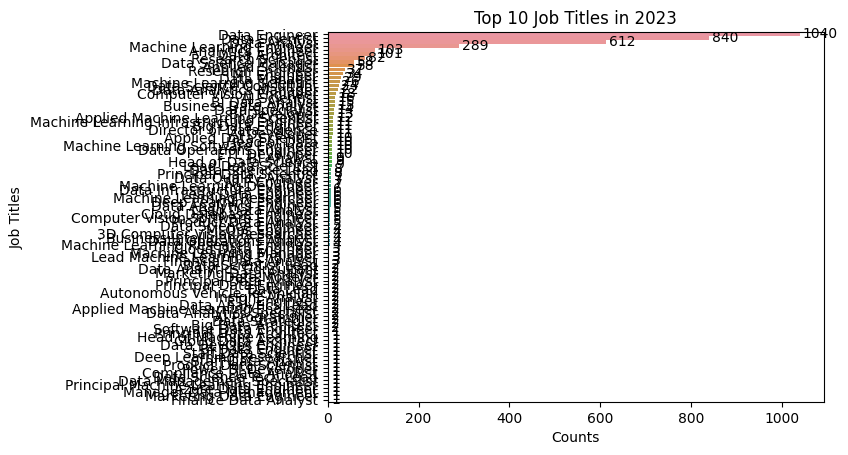

In [15]:
jobs = df[df['work_year']==2023]['job_title'].value_counts().nlargest(10).reset_index()
fig, ax = plt.subplots()
ax = sns.barplot(ax = ax, data = jobs , y = df.job_title.value_counts().index, x = df.job_title.value_counts())
ax.set(ylabel='Job Titles',xlabel='Counts', title='Top 10 Job Titles in 2023')
ax.bar_label(ax.containers[0], padding = 2)

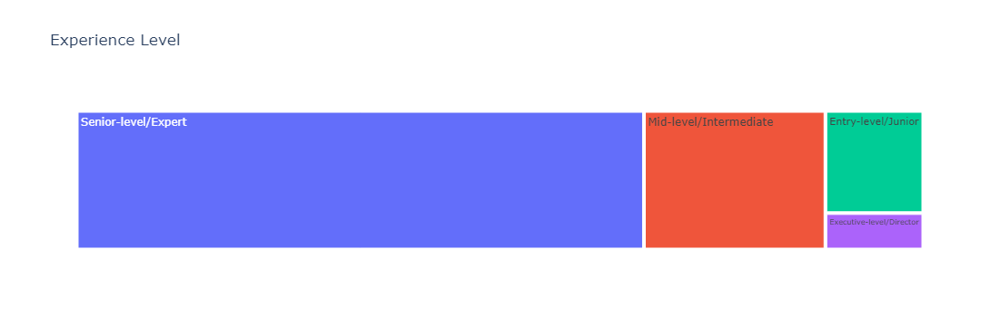

In [16]:
df['experience_level'] = df['experience_level'].replace('EN','Entry-level/Junior')
df['experience_level'] = df['experience_level'].replace('MI','Mid-level/Intermediate')
df['experience_level'] = df['experience_level'].replace('SE','Senior-level/Expert')
df['experience_level'] = df['experience_level'].replace('EX','Executive-level/Director')

ex_level = df['experience_level'].value_counts()
fig = px.treemap(ex_level, path = [ex_level.index], values = ex_level.values, 
                title = 'Experience Level')
fig.show()

[Text(0, 0, '2516'), Text(0, 0, '805'), Text(0, 0, '320'), Text(0, 0, '114')]

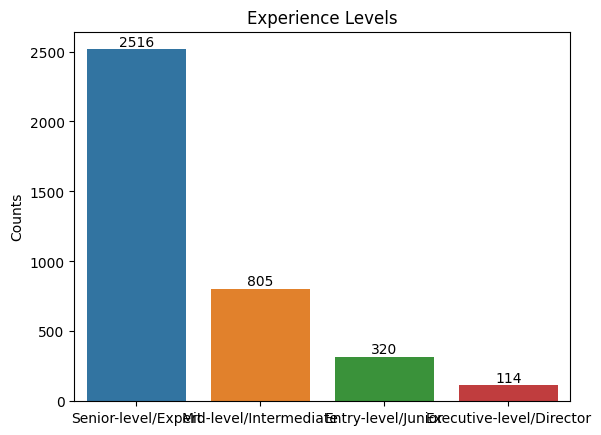

In [17]:
fig, ax = plt.subplots()
sns.countplot(ax = ax, data = df, x = df.experience_level)
ax.set(xlabel='', ylabel='Counts', title='Experience Levels')
ax.bar_label(ax.containers[0])

In [18]:
df['employment_type'] = df['employment_type'].replace('FT','Full-Time')
df['employment_type'] = df['employment_type'].replace('PT','Part-Time')
df['employment_type'] = df['employment_type'].replace('CT','Contract')
df['employment_type'] = df['employment_type'].replace('FL','Freelance')

[Text(0, 0, '113'), Text(0, 0, '1'), Text(0, 0, '0'), Text(0, 0, '0')]

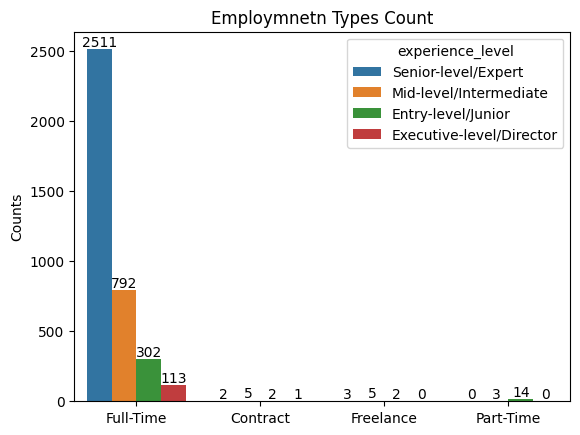

In [19]:
fig, ax = plt.subplots()
sns.countplot(ax = ax, data = df, x = df.employment_type, hue = 'experience_level')

ax.set(xlabel='', ylabel='Counts', title='Employmnetn Types Count')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
ax.bar_label(ax.containers[2])
ax.bar_label(ax.containers[3])

AttributeError: 'numpy.int64' object has no attribute 'startswith'

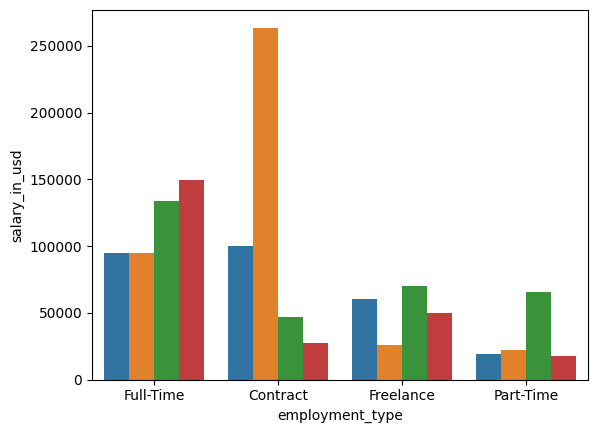

In [20]:
avg_salaries = df.groupby('employment_type')['salary_in_usd'].mean().round(0).sort_values(ascending = False).reset_index()
fig, ax = plt.subplots()
sns.barplot(ax =ax,data = df , x = 'employment_type', y = 'salary_in_usd',errorbar = None, hue = 'work_year')
ax.set(xlabel='', ylabel='Dollars', title='Average Salaries in Dollars Per Year')
ax.bar_label(ax.containers[3], padding = 2)

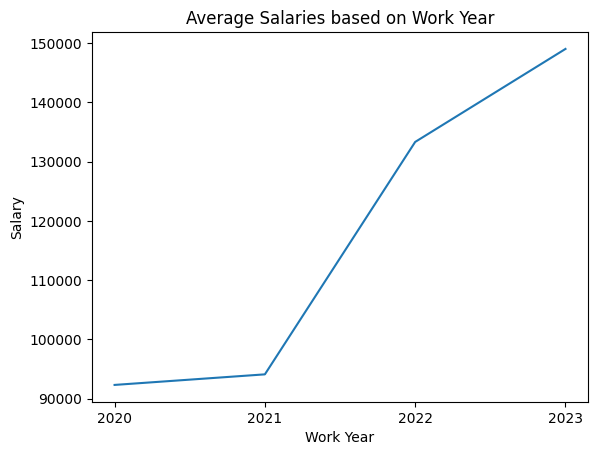

In [21]:
df['salary_in_usd'].groupby(df['work_year']) .mean()
year_based_salary=np.array(df['salary_in_usd'].groupby(df['work_year']) .mean())
plt.title("Average Salaries based on Work Year")
plt.xlabel('Work Year')
plt.ylabel('Salary')
sns.lineplot(x=['2020', '2021', '2022','2023'],y=year_based_salary)
plt.show()

In [22]:
rr = df.groupby('company_location')['remote_ratio'].mean().reset_index()
rr['company_location'] =  coco.convert(names = rr['company_location'], to = "ISO3")
rr.head()

,company_location,remote_ratio
0,ARE,66.666667
1,ALB,50.000000
2,ARM,0.000000
3,ARG,100.000000
4,ASM,66.666667


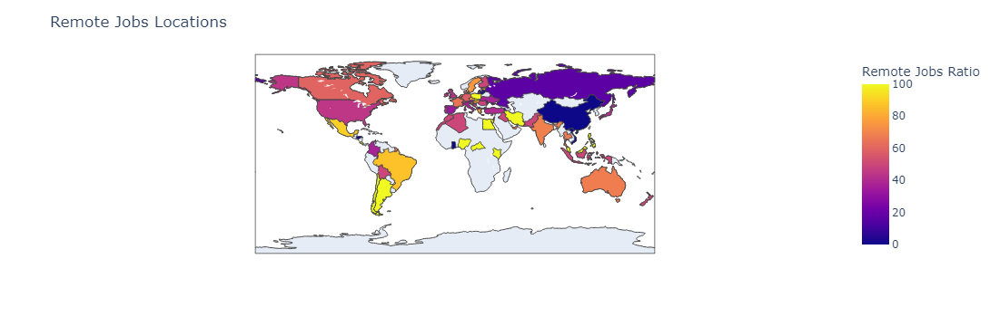

In [23]:
fig = px.choropleth(rr,
                    locations = rr.company_location, 
                    color = rr.remote_ratio,                  
                    labels={'company_location':'Country','remote_ratio':'Remote Jobs Ratio'})
                    
fig.update_layout(title = "Remote Jobs Locations")
fig.show()

In [24]:
data = df.drop_duplicates(keep='first')
data['experience_level'] = data['experience_level'].replace({
    'SE': 'Senior',
    'EN': 'Entry level',
    'EX': 'Executive level',
    'MI': 'Mid/Intermediate level',
})

data['employment_type'] = data['employment_type'].replace({
    'FL': 'Freelancer',
    'CT': 'Contractor',
    'FT' : 'Full-time',
    'PT' : 'Part-time'
})
data['company_size'] = data['company_size'].replace({
    'S': 'SMALL',
    'M': 'MEDIUM',
    'L' : 'LARGE',
})
data['remote_ratio'] = data['remote_ratio'].astype(str)
data['remote_ratio'] = data['remote_ratio'].replace({
    '0': 'On-Site',
    '50': 'Half-Remote',
    '100' : 'Full-Remote',
})
data

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,Senior-level/Expert,Full-Time,Principal Data Scientist,80000,EUR,85847,ES,Full-Remote,ES,LARGE
1,2023,Mid-level/Intermediate,Contract,ML Engineer,30000,USD,30000,US,Full-Remote,US,SMALL
2,2023,Mid-level/Intermediate,Contract,ML Engineer,25500,USD,25500,US,Full-Remote,US,SMALL
3,2023,Senior-level/Expert,Full-Time,Data Scientist,175000,USD,175000,CA,Full-Remote,CA,MEDIUM
4,2023,Senior-level/Expert,Full-Time,Data Scientist,120000,USD,120000,CA,Full-Remote,CA,MEDIUM
...,...,...,...,...,...,...,...,...,...,...,...
3750,2020,Senior-level/Expert,Full-Time,Data Scientist,412000,USD,412000,US,Full-Remote,US,LARGE
3751,2021,Mid-level/Intermediate,Full-Time,Principal Data Scientist,151000,USD,151000,US,Full-Remote,US,LARGE
3752,2020,Entry-level/Junior,Full-Time,Data Scientist,105000,USD,105000,US,Full-Remote,US,SMALL
3753,2020,Entry-level/Junior,Contract,Business Data Analyst,100000,USD,100000,US,Full-Remote,US,LARGE


In [25]:
def assign_broader_category(job_title):
    data_engineering = ["Data Engineer", "Data Analyst", "Analytics Engineer", "BI Data Analyst", "Business Data Analyst", "BI Developer", "BI Analyst", "Business Intelligence Engineer", "BI Data Engineer", "Power BI Developer"]
    data_scientist = ["Data Scientist", "Applied Scientist", "Research Scientist", "3D Computer Vision Researcher", "Deep Learning Researcher", "AI/Computer Vision Engineer"]
    machine_learning = ["Machine Learning Engineer", "ML Engineer", "Lead Machine Learning Engineer", "Principal Machine Learning Engineer"]
    data_architecture = ["Data Architect", "Big Data Architect", "Cloud Data Architect", "Principal Data Architect"]
    management = ["Data Science Manager", "Director of Data Science", "Head of Data Science", "Data Scientist Lead", "Head of Machine Learning", "Manager Data Management", "Data Analytics Manager"]
    
    if job_title in data_engineering:
        return "Data Engineering"
    elif job_title in data_scientist:
        return "Data Science"
    elif job_title in machine_learning:
        return "Machine Learning"
    elif job_title in data_architecture:
        return "Data Architecture"
    elif job_title in management:
        return "Management"
    else:
        return "Other"

data['job_category'] = data['job_title'].apply(assign_broader_category)
data

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,job_category
0,2023,Senior-level/Expert,Full-Time,Principal Data Scientist,80000,EUR,85847,ES,Full-Remote,ES,LARGE,Other
1,2023,Mid-level/Intermediate,Contract,ML Engineer,30000,USD,30000,US,Full-Remote,US,SMALL,Machine Learning
2,2023,Mid-level/Intermediate,Contract,ML Engineer,25500,USD,25500,US,Full-Remote,US,SMALL,Machine Learning
3,2023,Senior-level/Expert,Full-Time,Data Scientist,175000,USD,175000,CA,Full-Remote,CA,MEDIUM,Data Science
4,2023,Senior-level/Expert,Full-Time,Data Scientist,120000,USD,120000,CA,Full-Remote,CA,MEDIUM,Data Science
...,...,...,...,...,...,...,...,...,...,...,...,...
3750,2020,Senior-level/Expert,Full-Time,Data Scientist,412000,USD,412000,US,Full-Remote,US,LARGE,Data Science
3751,2021,Mid-level/Intermediate,Full-Time,Principal Data Scientist,151000,USD,151000,US,Full-Remote,US,LARGE,Other
3752,2020,Entry-level/Junior,Full-Time,Data Scientist,105000,USD,105000,US,Full-Remote,US,SMALL,Data Science
3753,2020,Entry-level/Junior,Contract,Business Data Analyst,100000,USD,100000,US,Full-Remote,US,LARGE,Data Engineering


In [26]:
us_inflation_rates = {2019: 0.0181, 2020: 0.0123, 2021: 0.0470,2022: 0.065}
global_inflation_rates = {2019: 0.0219, 2020: 0.0192, 2021: 0.0350,2022: 0.088}


def adjust_salary(row):
    year = row['work_year']
    original_salary = row['salary_in_usd']
    currency = row['salary_currency']
    
    if year == 2023:
        return original_salary
    
    years_to_2023 = 2023 - year
    
    if currency == 'USD':
        inflation_rate = us_inflation_rates[year]
    else:
        inflation_rate = global_inflation_rates[year]
        
    adjusted_salary = original_salary * (1 + inflation_rate) ** years_to_2023
    return adjusted_salary

data['adjusted_salary'] = data.apply(adjust_salary, axis=1)

In [27]:
data2 = data.copy()
data2

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,job_category,adjusted_salary
0,2023,Senior-level/Expert,Full-Time,Principal Data Scientist,80000,EUR,85847,ES,Full-Remote,ES,LARGE,Other,85847.000000
1,2023,Mid-level/Intermediate,Contract,ML Engineer,30000,USD,30000,US,Full-Remote,US,SMALL,Machine Learning,30000.000000
2,2023,Mid-level/Intermediate,Contract,ML Engineer,25500,USD,25500,US,Full-Remote,US,SMALL,Machine Learning,25500.000000
3,2023,Senior-level/Expert,Full-Time,Data Scientist,175000,USD,175000,CA,Full-Remote,CA,MEDIUM,Data Science,175000.000000
4,2023,Senior-level/Expert,Full-Time,Data Scientist,120000,USD,120000,CA,Full-Remote,CA,MEDIUM,Data Science,120000.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3750,2020,Senior-level/Expert,Full-Time,Data Scientist,412000,USD,412000,US,Full-Remote,US,LARGE,Data Science,427390.561117
3751,2021,Mid-level/Intermediate,Full-Time,Principal Data Scientist,151000,USD,151000,US,Full-Remote,US,LARGE,Other,165527.559000
3752,2020,Entry-level/Junior,Full-Time,Data Scientist,105000,USD,105000,US,Full-Remote,US,SMALL,Data Science,108922.351741
3753,2020,Entry-level/Junior,Contract,Business Data Analyst,100000,USD,100000,US,Full-Remote,US,LARGE,Data Engineering,103735.573087


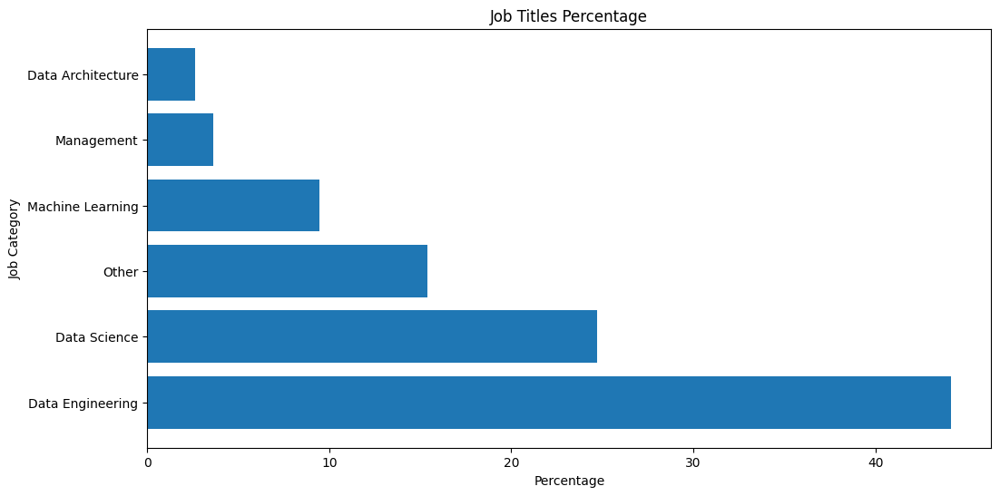

In [28]:
value_counts = data['job_category'].value_counts(normalize=True) * 100

fig, ax = plt.subplots(figsize=(12, 6))
top_n = min(17, len(value_counts))
ax.barh(value_counts.index[:top_n], value_counts.values[:top_n])
ax.set_xlabel('Percentage')
ax.set_ylabel('Job Category')
ax.set_title('Job Titles Percentage')
plt.show()

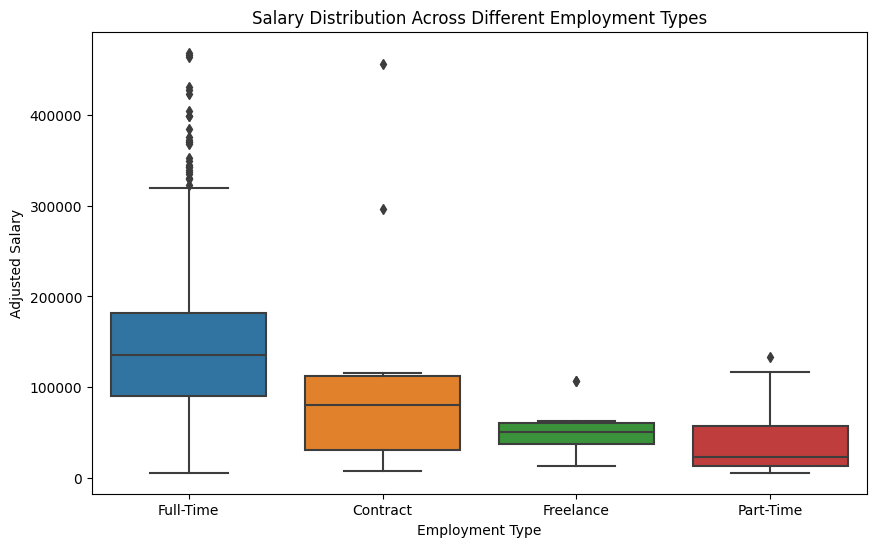

In [29]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='employment_type', y='adjusted_salary')
plt.title('Salary Distribution Across Different Employment Types')
plt.xlabel('Employment Type')
plt.ylabel('Adjusted Salary')
plt.show()

adjusted_salary: mu = 138069.04, sigma = 68946.30
adjusted_salary: Skewness: 0.63
adjusted_salary: Kurtosis: 0.96


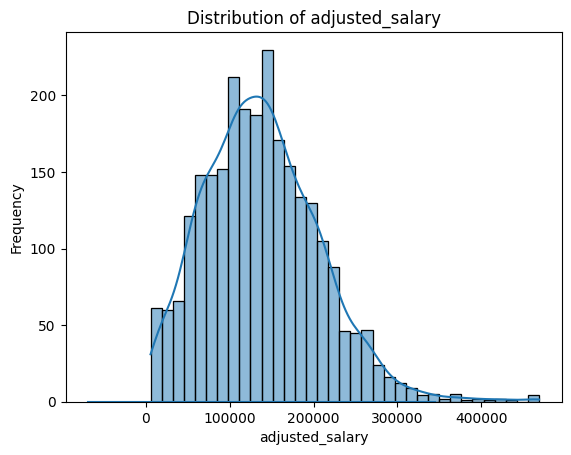

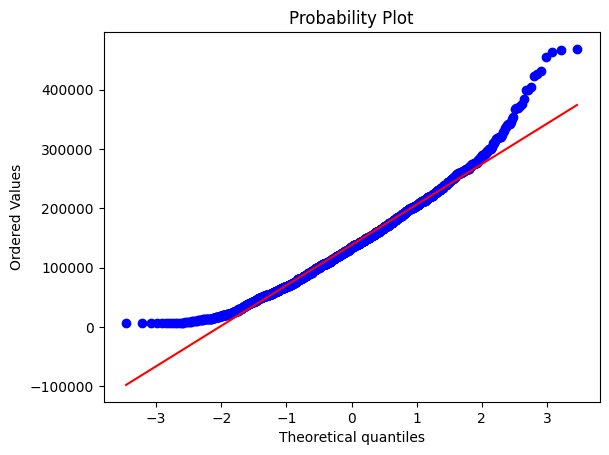

In [30]:
columns = ['adjusted_salary']

for col in columns:
    sns.histplot(data[col], kde=True)

    (mu, sigma) = stats.norm.fit(data[col])
    print('{}: mu = {:.2f}, sigma = {:.2f}'.format(col, mu, sigma))

    print('{}: Skewness: {:.2f}'.format(col, data[col].skew()))
    print('{}: Kurtosis: {:.2f}'.format(col, data[col].kurt()))

    x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
    y = stats.norm.pdf(x, mu, sigma)
    plt.plot(x, y, label='Normal fit')

    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.title('Distribution of {}'.format(col))

    fig = plt.figure()
    stats.probplot(data[col], plot=plt)

    plt.show()

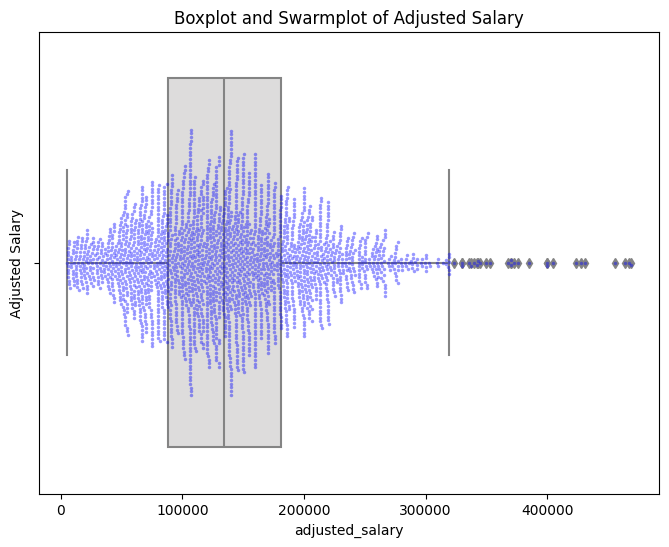

,adjusted_salary
count,2584.00
mean,138069.04
std,68959.64
min,5583.62
25%,88260.18
50%,134107.00
75%,181050.00
max,468892.10


In [31]:
formatted_data = data.loc[:, 'adjusted_salary'].describe().apply(lambda x: f'{x:.2f}')

plt.figure(figsize=(8, 6))
sns.boxplot(x=data['adjusted_salary'], palette='coolwarm')
sns.swarmplot(x=data['adjusted_salary'], color='blue', alpha=0.4, size=2.5)
plt.ylabel('Adjusted Salary')
plt.title('Boxplot and Swarmplot of Adjusted Salary')
plt.show()

styled_data = formatted_data.to_frame().style \
    .background_gradient(cmap='Blues') \
    .set_properties(**{'text-align': 'center', 'border': '1px solid black'})

display(styled_data)

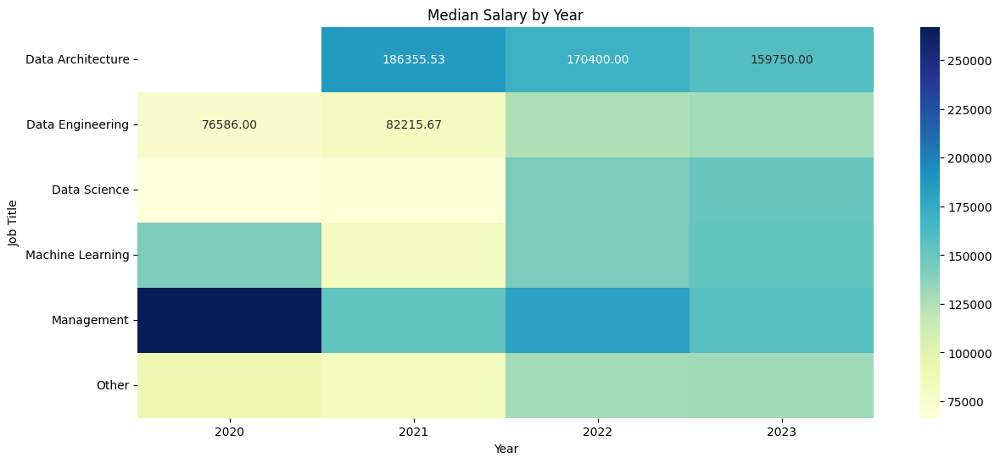

In [32]:
pivot_table = data2.pivot_table(values='adjusted_salary', index='job_category', columns='work_year', aggfunc='median')
plt.figure(figsize=(14, 6))
sns.heatmap(pivot_table, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title('Median Salary by Year')
plt.xlabel('Year')
plt.ylabel('Job Title')
plt.show()

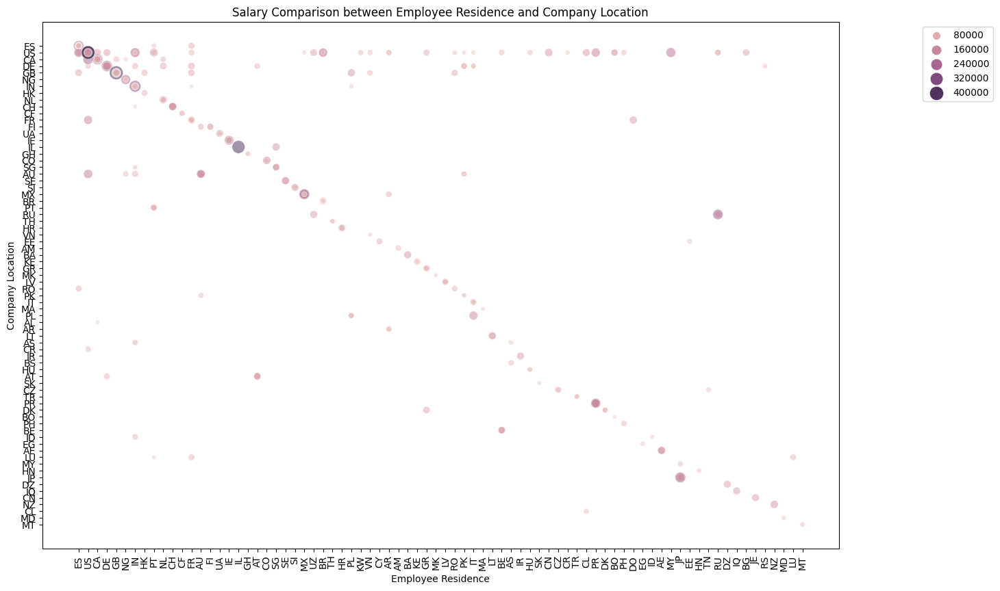

In [33]:
plt.figure(figsize=(15, 10))
sns.scatterplot(data=data2, x='employee_residence', y='company_location', hue='adjusted_salary', size='adjusted_salary', sizes=(20, 200), alpha=0.5)
plt.title('Salary Comparison between Employee Residence and Company Location')
plt.xlabel('Employee Residence')
plt.ylabel('Company Location')
plt.xticks(rotation=90)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.show()

In [34]:
def country_code_to_name(country_code):
    try:
        return pycountry.countries.get(alpha_2=country_code).name
    except:
        return country_code
def country_code_to_name(code):
    try:
        country = pycountry.countries.get(alpha_2=code)
        return country.name
    except:
        return None

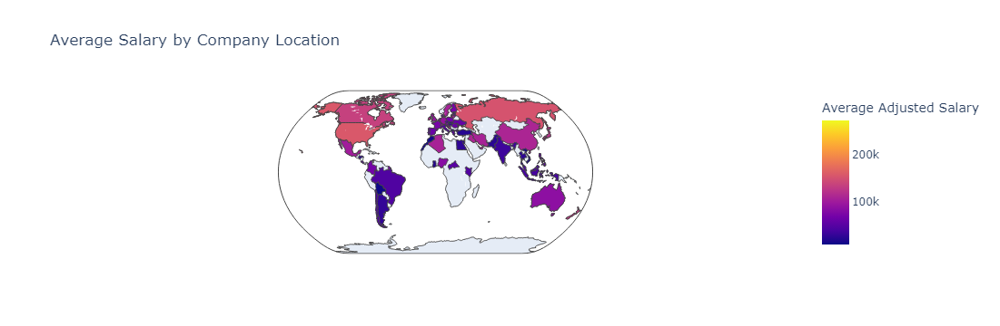

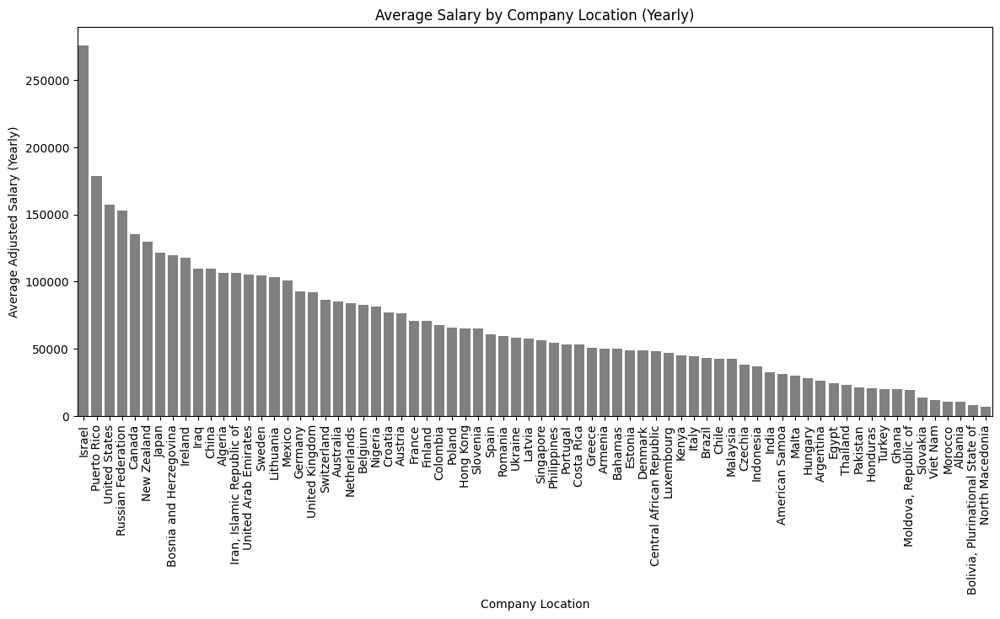

In [35]:
data2['company_location'] = data2['company_location'].apply(country_code_to_name)
data2['employee_residence'] = data2['employee_residence'].apply(country_code_to_name)

avg_salary_by_location = data2.groupby('company_location', as_index=False)['adjusted_salary'].mean()

fig1 = px.choropleth(avg_salary_by_location,
                     locations='company_location',
                     locationmode='country names',
                     color='adjusted_salary',
                     hover_name='company_location',
                     color_continuous_scale=px.colors.sequential.Plasma,
                     title='Average Salary by Company Location',
                     labels={'adjusted_salary': 'Average Adjusted Salary'},
                     projection='natural earth')

fig1.show()

avg_salary_by_location = data2.groupby('company_location')['adjusted_salary'].mean().sort_values(ascending=False)
plt.figure(figsize=(14, 6))
sns.barplot(x=avg_salary_by_location.index, y=avg_salary_by_location, color='grey')
plt.title('Average Salary by Company Location (Yearly)')
plt.xlabel('Company Location')
plt.ylabel('Average Adjusted Salary (Yearly)')
plt.xticks(rotation=90)
plt.show()

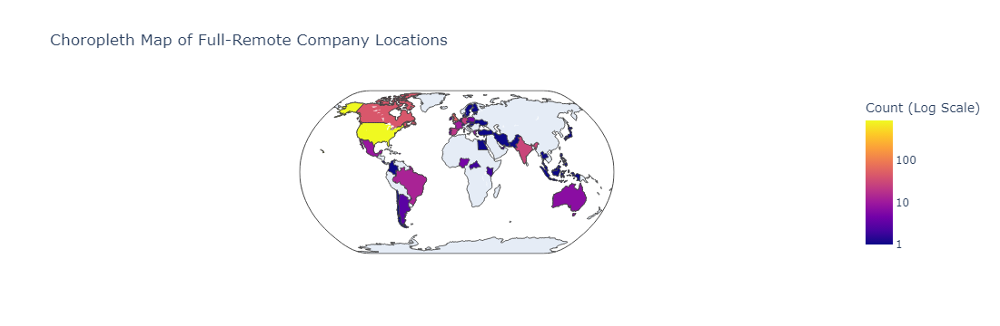

In [36]:
remote_100 = data[data['remote_ratio'] == 'Full-Remote']

country_counts = remote_100['company_location'].value_counts().reset_index()
country_counts.columns = ['country_code', 'count']

country_counts['country_name'] = country_counts['country_code'].apply(country_code_to_name)

fig = px.choropleth(country_counts, 
                    locations='country_name', 
                    locationmode='country names',
                    color=np.log10(country_counts['count']), 
                    hover_name='country_name',
                    hover_data=['count'],
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title='Choropleth Map of Full-Remote Company Locations',
                    projection='natural earth')

fig.update_coloraxes(colorbar=dict(title='Count (Log Scale)', tickvals=[0, 1, 2, 3], ticktext=['1', '10', '100', '1000']))

fig.show()

In [37]:
categorical_columns = ['experience_level', 'employment_type', 'remote_ratio','company_size','job_category']
numerical_columns = ['adjusted_salary']

In [38]:
dummy_variables = pd.get_dummies(data2, columns=categorical_columns, drop_first=False)

In [39]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

scaled_numerical = scaler.fit_transform(data2[numerical_columns])

scaled_numerical_df = pd.DataFrame(scaled_numerical, columns=numerical_columns)

In [40]:
dummy_variables = dummy_variables.drop(numerical_columns, axis=1)

processed_df = pd.concat([dummy_variables, scaled_numerical_df], axis=1)
processed_df = processed_df.drop(['work_year', 'salary','salary_in_usd'], axis=1)

In [45]:
correlation_matrix = processed_df.corr()

plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title("Correlation Matrix Heatmap")
plt.show()

corr = processed_df.corr()
target_corr = corr['adjusted_salary'].drop('adjusted_salary')

target_corr_sorted = target_corr.sort_values(ascending=False)

sns.set(font_scale=0.8)
sns.set_style("white")
sns.set_palette("PuBuGn_d")
sns.heatmap(target_corr_sorted.to_frame(), cmap="coolwarm", annot=True, fmt='.2f')
plt.title('Correlation with Salary')
plt.show()

ValueError: could not convert string to float: 'Principal Data Scientist'

In [46]:
country_map = {}
for country in pycountry.countries:
    country_map[country.alpha_2] = country.name
data['employee_residence'] = data['employee_residence'].replace(country_map)
data['company_location'] = data['company_location'].replace(country_map)

In [47]:
df2 = data.copy()
df2 = df2.drop(['work_year','salary','salary_currency','salary_in_usd','salary_in_usd','job_title'], axis=1)
df2.head()

,experience_level,employment_type,employee_residence,remote_ratio,company_location,company_size,job_category,adjusted_salary
0,Senior-level/Expert,Full-Time,Spain,Full-Remote,Spain,LARGE,Other,85847.0
1,Mid-level/Intermediate,Contract,United States,Full-Remote,United States,SMALL,Machine Learning,30000.0
2,Mid-level/Intermediate,Contract,United States,Full-Remote,United States,SMALL,Machine Learning,25500.0
3,Senior-level/Expert,Full-Time,Canada,Full-Remote,Canada,MEDIUM,Data Science,175000.0
4,Senior-level/Expert,Full-Time,Canada,Full-Remote,Canada,MEDIUM,Data Science,120000.0


In [48]:
Q1 = df2.quantile(0.25)
Q3 = df2.quantile(0.75)
IQR = Q3 - Q1
df2 = df2[~((df2 < (Q1 - 1.5 * IQR)) | (df2 > (Q3 + 1.5 * IQR))).any(axis=1)]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [49]:
quantiles = [0, 1/7, 2/7, 3/7, 4/7, 5/7, 6/7, 1]
bin_edges = [df2['adjusted_salary'].quantile(q) for q in quantiles]

salary_labels = ['low', 'low-mid', 'mid', 'mid-high', 'high', 'very-high', 'Top']
df2['salary_range'] = pd.cut(df2['adjusted_salary'], bins=bin_edges, labels=salary_labels, include_lowest=True)

In [50]:
encoder = LabelEncoder()
categorical_features = ['employment_type', 'job_category', 'experience_level', 
                        'employee_residence', 'remote_ratio', 'company_location', 'company_size']
for feature in categorical_features:
    df2[feature] = encoder.fit_transform(df2[feature])
X = df2.drop(["adjusted_salary", "salary_range"], axis=1)
y = df2["salary_range"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [51]:
models = [
    ('Logistic Regression', LogisticRegression(max_iter=1000)),
    ('Random Forest', RandomForestClassifier()),
    ('Gradient Boosting', GradientBoostingClassifier())
]

best_model = None
best_score = -np.inf

print("Model performance:")
for name, model in models:
    pipeline = Pipeline([('scaler', StandardScaler()), ('model', model)])
    pipeline.fit(X_train, y_train)
    
    y_pred = pipeline.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    
    print(f"{name} - Accuracy: {accuracy:.2f}")
    
    if accuracy > best_score:
        best_score = accuracy
        best_model = pipeline

print(f"Best model: {best_model.named_steps['model']} with accuracy: {best_score:.2f}")

Model performance:
Logistic Regression - Accuracy: 0.22
Random Forest - Accuracy: 0.28
Gradient Boosting - Accuracy: 0.28
Best model: RandomForestClassifier() with accuracy: 0.28


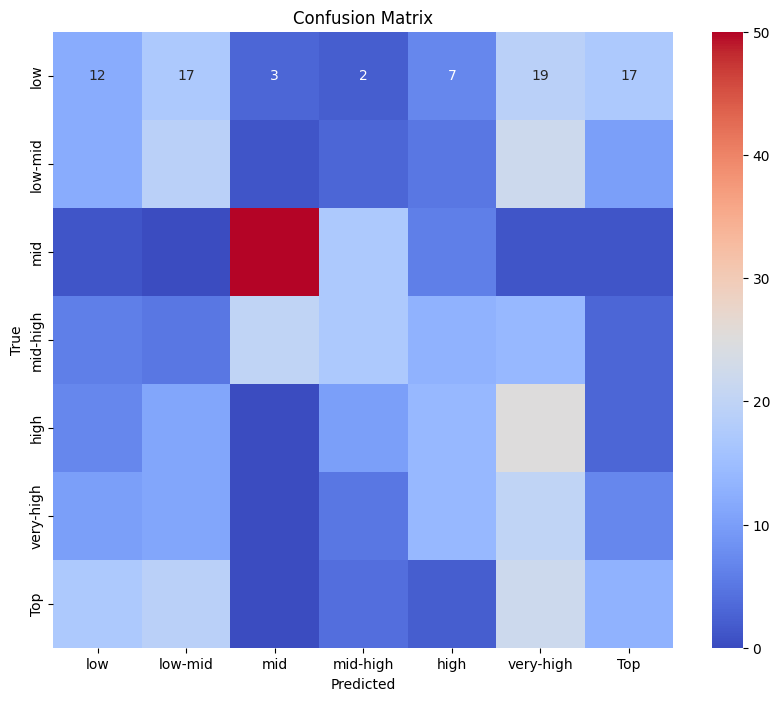

Classification Report:
              precision    recall  f1-score   support

         low       0.18      0.16      0.17        77
     low-mid       0.23      0.26      0.25        72
         mid       0.68      0.66      0.67        76
    mid-high       0.29      0.22      0.25        78
        high       0.23      0.20      0.21        70
   very-high       0.16      0.30      0.21        67
         Top       0.24      0.17      0.20        77

    accuracy                           0.28       517
   macro avg       0.29      0.28      0.28       517
weighted avg       0.29      0.28      0.28       517



In [52]:
y_pred = best_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', xticklabels=salary_labels, yticklabels=salary_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title("Confusion Matrix")
plt.show()

print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=salary_labels))

In [53]:
cat_columns = ['employment_type', 'job_category', 'experience_level', 'employee_residence', 'remote_ratio', 'company_location', 'company_size']

def get_best_categories(df2, cat_columns):
    best_categories = {}
    for col in cat_columns:
        best_category = df2.groupby(col)['adjusted_salary'].mean().idxmax()
        best_categories[col] = best_category
    return best_categories

best_categories = get_best_categories(df2, cat_columns)
print("Best categories for maximizing adjusted salary:")
for key, value in best_categories.items():
    print(f"{key.capitalize()}: {value}")

Best categories for maximizing adjusted salary:
Employment_type: 2
Job_category: 4
Experience_level: 1
Employee_residence: 37
Remote_ratio: 2
Company_location: 36
Company_size: 1


In [54]:
categorical_cols = df.select_dtypes(include="object").columns.tolist()
for col in categorical_cols:
    print(f"{col}", f"Number of unique entries: {len(df[col].unique().tolist())},")
    print(df[col].unique().tolist())

experience_level Number of unique entries: 4,
['Senior-level/Expert', 'Mid-level/Intermediate', 'Entry-level/Junior', 'Executive-level/Director']
employment_type Number of unique entries: 4,
['Full-Time', 'Contract', 'Freelance', 'Part-Time']
job_title Number of unique entries: 93,
['Principal Data Scientist', 'ML Engineer', 'Data Scientist', 'Applied Scientist', 'Data Analyst', 'Data Modeler', 'Research Engineer', 'Analytics Engineer', 'Business Intelligence Engineer', 'Machine Learning Engineer', 'Data Strategist', 'Data Engineer', 'Computer Vision Engineer', 'Data Quality Analyst', 'Compliance Data Analyst', 'Data Architect', 'Applied Machine Learning Engineer', 'AI Developer', 'Research Scientist', 'Data Analytics Manager', 'Business Data Analyst', 'Applied Data Scientist', 'Staff Data Analyst', 'ETL Engineer', 'Data DevOps Engineer', 'Head of Data', 'Data Science Manager', 'Data Manager', 'Machine Learning Researcher', 'Big Data Engineer', 'Data Specialist', 'Lead Data Analyst', '

In [55]:
def plot_bar_chart(df_column, x_label='', y_label='', title='', whole_numbers_only=False, count_labels=True, as_percentage=True):
    if whole_numbers_only:
        df_column = df_column[df_column % 1 == 0]
    plt.figure(figsize=(12, 8))
    y = [num for (s, num) in df_column.value_counts().items()]
    x = [s for (s, num) in df_column.value_counts().items()]
    ax = plt.bar(x, y, color='blue', alpha=0.5)
    try:
        plt.xticks(range(x[-1], x[0] + 1))
    except:
        pass
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    if count_labels:
        df_col = df_column.value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
        for idx, (year, value) in enumerate(df_column.value_counts().items()):
            if as_percentage == False:
                plt.annotate(f'{value}\n', xy=(year, value), ha='center', va='center')
            else:
                plt.annotate(f'{df_col[year]}\n', xy=(year, value), ha='center', va='center')
    plt.show()

In [56]:
def plot_top_n_bar_chart(df_column, n, x_label='', y_label='', title='', whole_numbers_only=False, count_labels=True, as_percentage=True):
    if whole_numbers_only:
        df_column = df_column[df_column % 1 == 0]
    plt.figure(figsize=(12, 8))
    y = [num for (s, num) in df_column.value_counts().head(n).items()]
    x = [s for (s, num) in df_column.value_counts().head(n).items()]
    ax = plt.bar(x, y, color='blue', alpha=0.5)
    try:
        plt.xticks(range(x[-1], x[0] + 1))
    except:
        pass
    plt.xlabel(x_label)
    plt.xticks(fontsize=10, rotation=30)
    plt.ylabel(y_label)
    plt.title(title)
    if count_labels:
        df_col = df_column.value_counts(normalize=True).mul(100).round(1).astype(str) + '%'
        for idx, (year, value) in enumerate(df_column.value_counts().head(n).items()):
            if as_percentage == False:
                plt.annotate(f'{value}\n', xy=(year, value), ha='center', va='center')
            else:
                plt.annotate(f'{df_col[year]}\n', xy=(year, value), ha='center', va='center')
    plt.show()

In [57]:
def plot_histogram(salaries, bins=10, xlabel='', ylabel='', title=''):
    plt.figure(figsize=(10, 6))
    plt.hist(salaries, bins=bins, edgecolor='black')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.show()

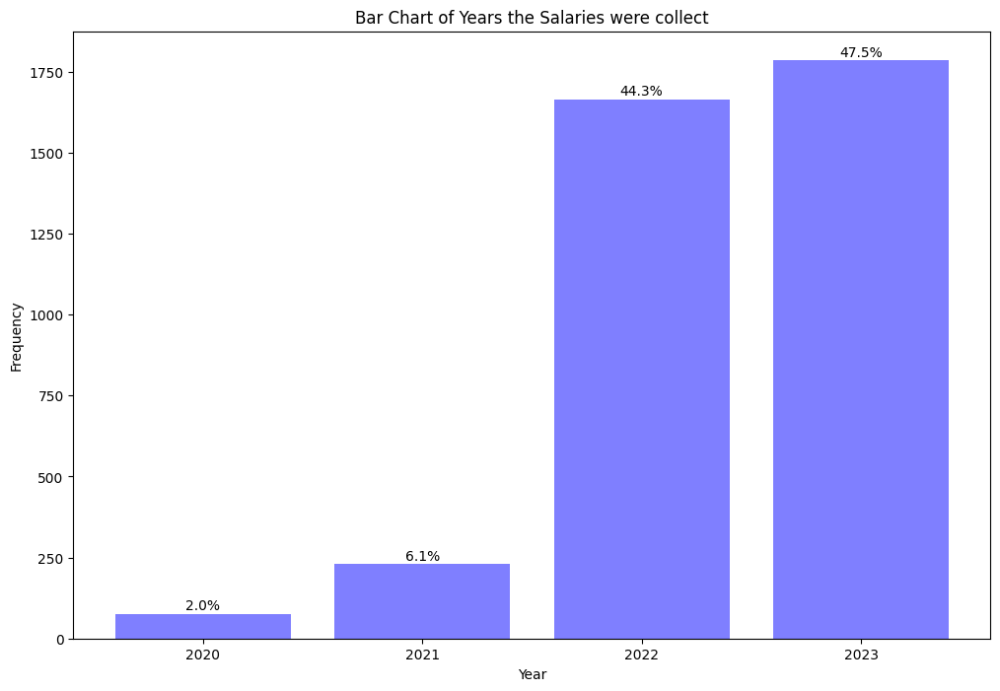

In [58]:
plot_bar_chart(df['work_year'], 'Year', 'Frequency', 'Bar Chart of Years the Salaries were collect', whole_numbers_only = True, count_labels=True)

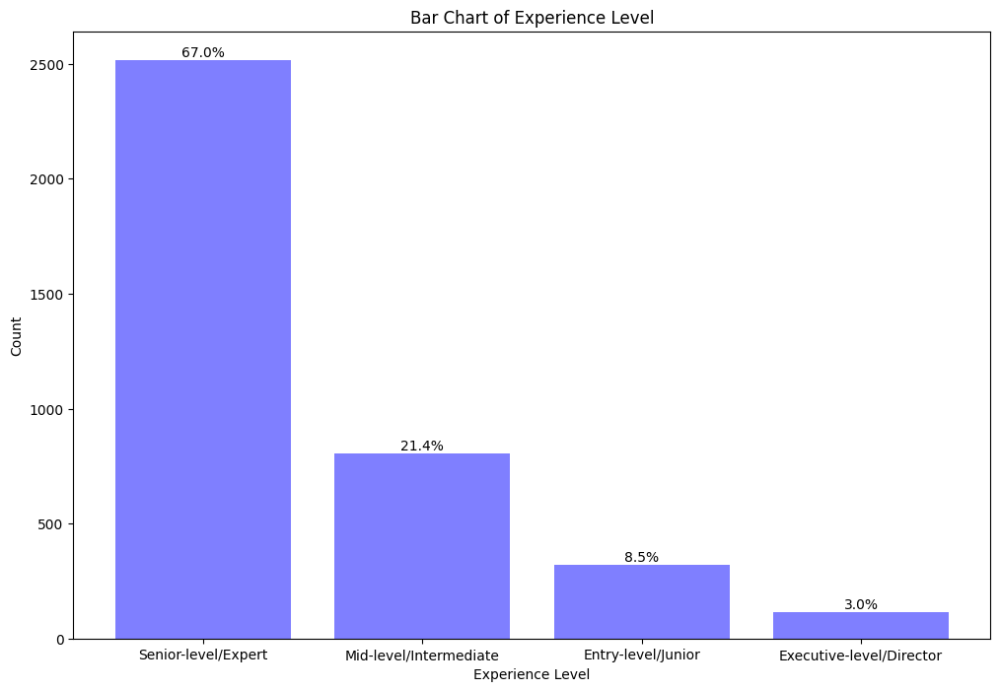

In [59]:
plot_bar_chart(df['experience_level'], 'Experience Level', 'Count', 'Bar Chart of Experience Level', whole_numbers_only = False, count_labels=True)

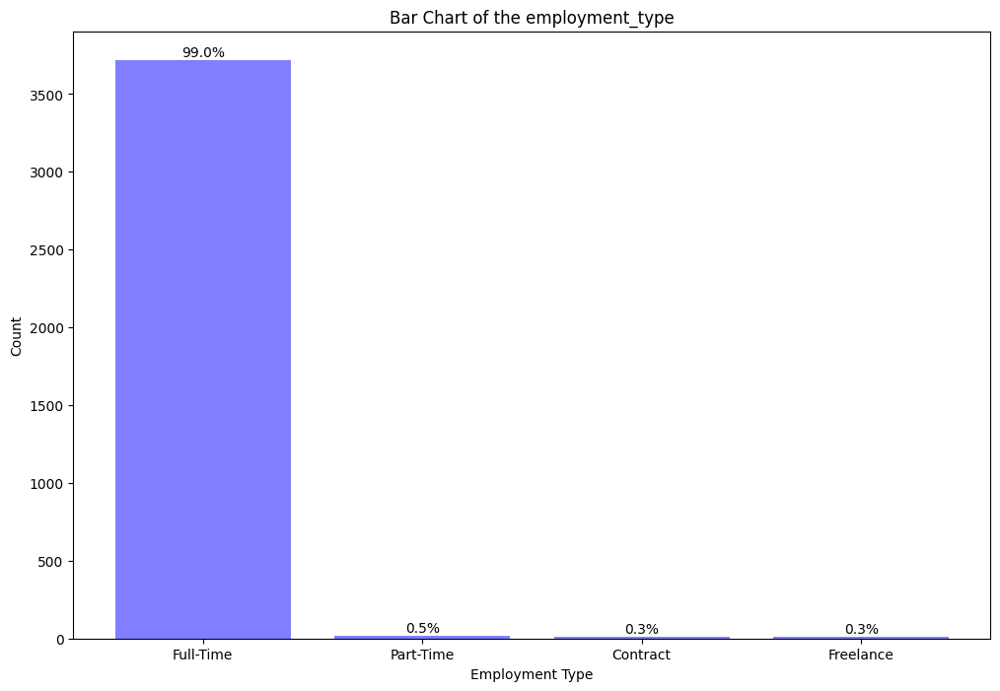

In [60]:
plot_bar_chart(df['employment_type'], 'Employment Type', 'Count', 'Bar Chart of the employment_type', whole_numbers_only = False, count_labels=True)

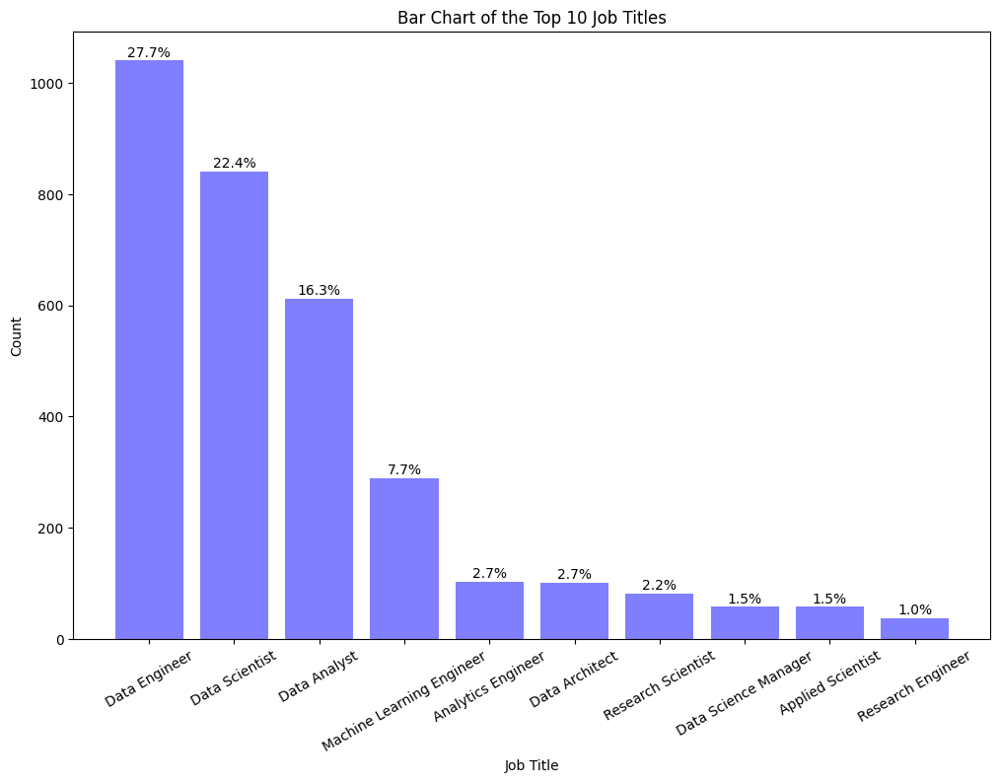

In [61]:
plot_top_n_bar_chart(df['job_title'], 10, x_label='Job Title', y_label='Count', title ='Bar Chart of the Top 10 Job Titles', whole_numbers_only = False, count_labels=True)

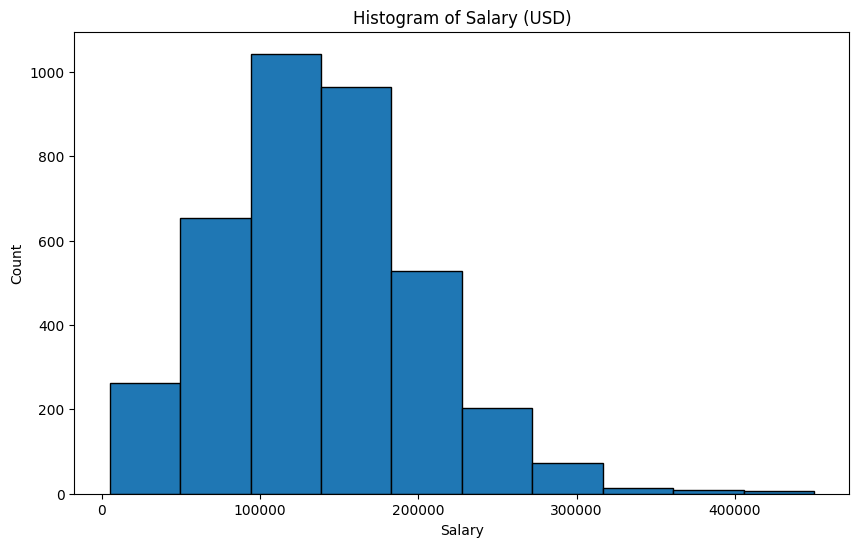

In [62]:
plot_histogram(df['salary_in_usd'], bins=10, xlabel='Salary', ylabel='Count', title='Histogram of Salary (USD)')

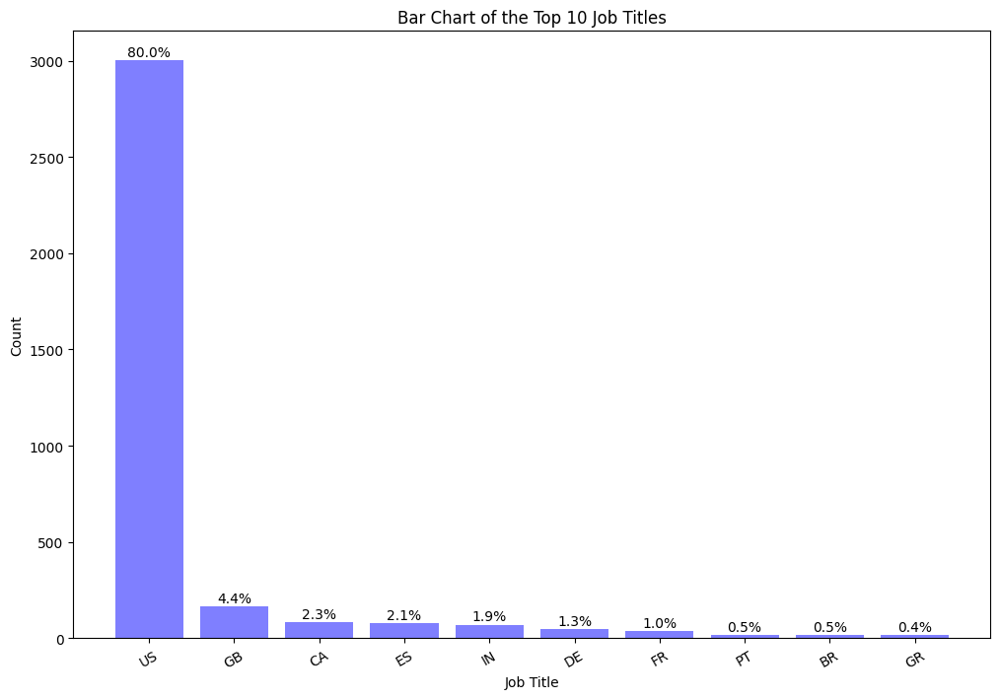

In [63]:
plot_top_n_bar_chart(df['employee_residence'], 10, x_label='Job Title', y_label='Count', title ='Bar Chart of the Top 10 Job Titles', whole_numbers_only = False, count_labels=True)

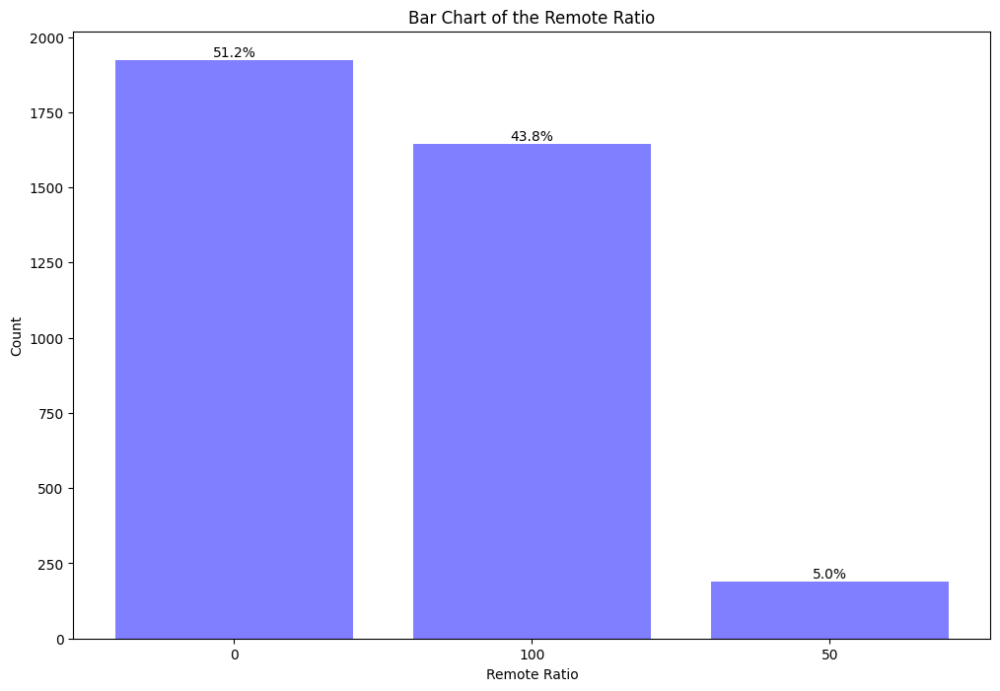

In [64]:
plot_bar_chart(df['remote_ratio'].astype('str'), 'Remote Ratio', 'Count', 'Bar Chart of the Remote Ratio', whole_numbers_only = False, count_labels=True)

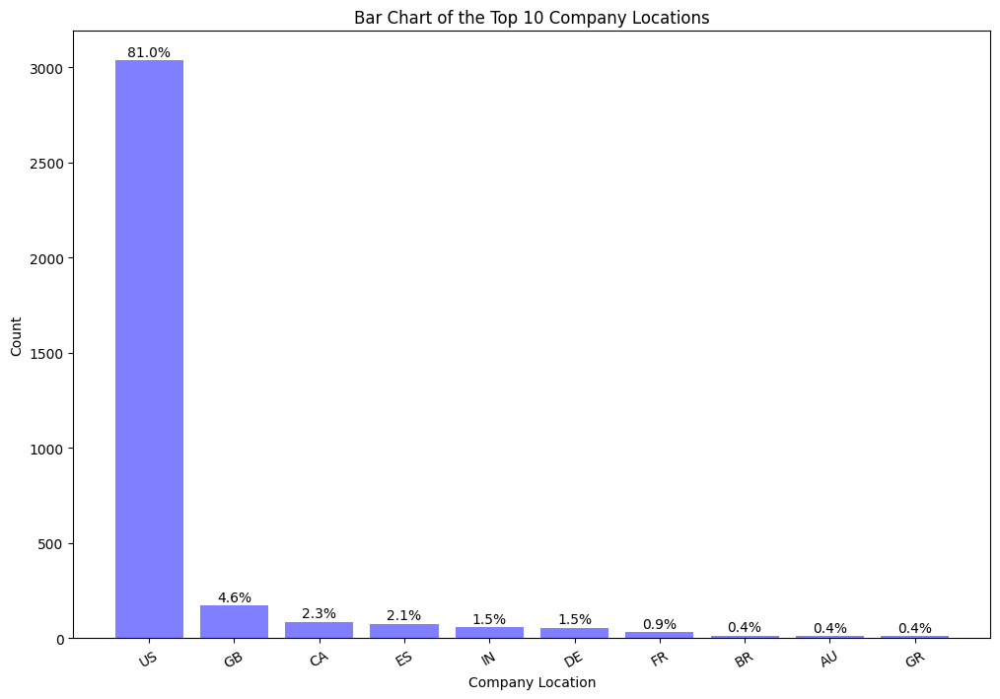

In [65]:
plot_top_n_bar_chart(df['company_location'], 10, x_label='Company Location', y_label='Count', title ='Bar Chart of the Top 10 Company Locations', whole_numbers_only = False, count_labels=True)

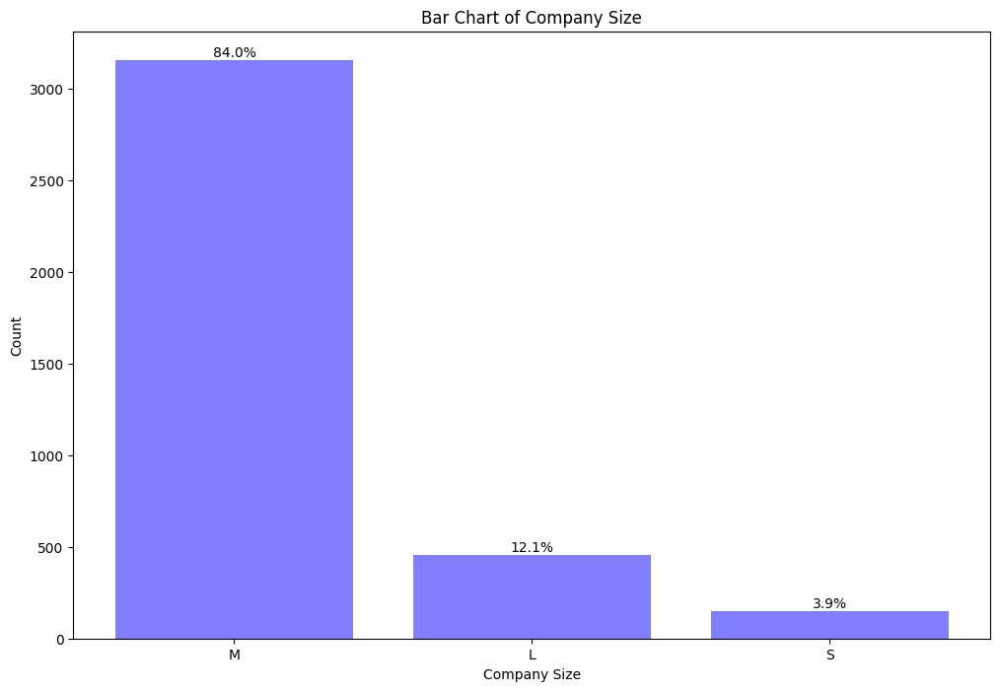

In [66]:
plot_bar_chart(df['company_size'], 'Company Size', 'Count', 'Bar Chart of Company Size', whole_numbers_only = False, count_labels=True)

In [67]:
def plot_boxplot(dataframe, x_column, y_column, top_n):
    top_x = dataframe[x_column].value_counts().nlargest(top_n).index
    top_x_data = dataframe[dataframe[x_column].isin(top_x)]
    
    plt.figure(figsize=(10, 6))
    plt.boxplot([top_x_data[top_x_data[x_column] == title][y_column] for title in top_x],
                labels=top_x)
    plt.xlabel(x_column)
    plt.ylabel(y_column)
    plt.title(f"Boxplot of Salaries for Top {top_n} Job Titles")
    plt.xticks(rotation=45)
    plt.show()

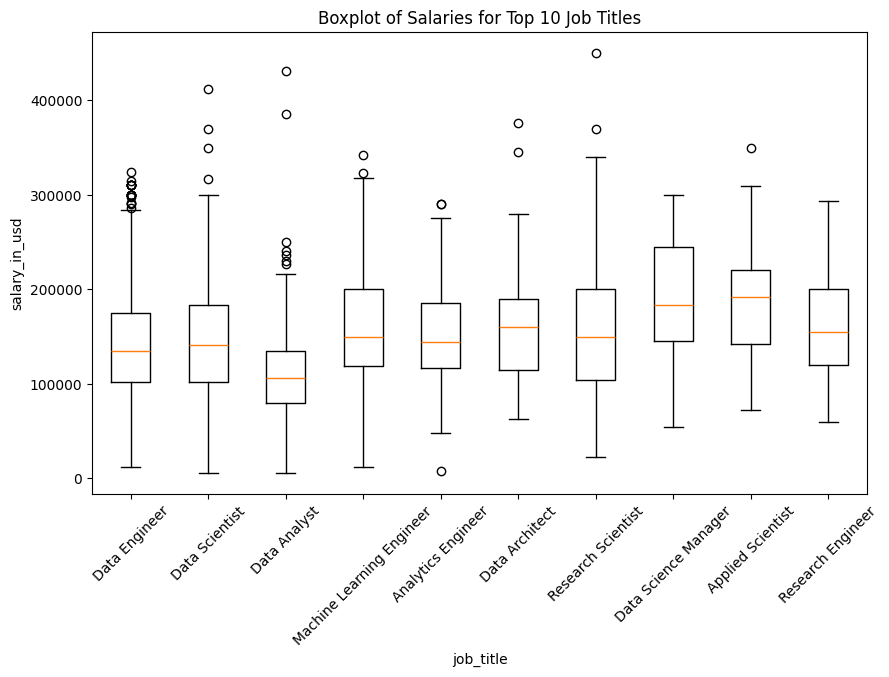

In [68]:
plot_boxplot(df, 'job_title', 'salary_in_usd', top_n = 10)

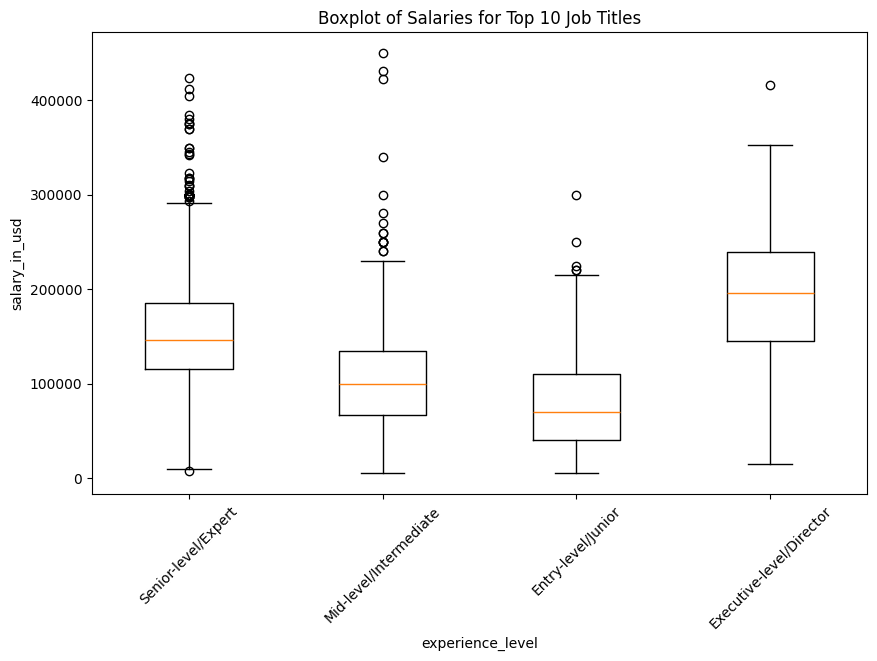

In [69]:
plot_boxplot(df, 'experience_level', 'salary_in_usd', top_n = 10)

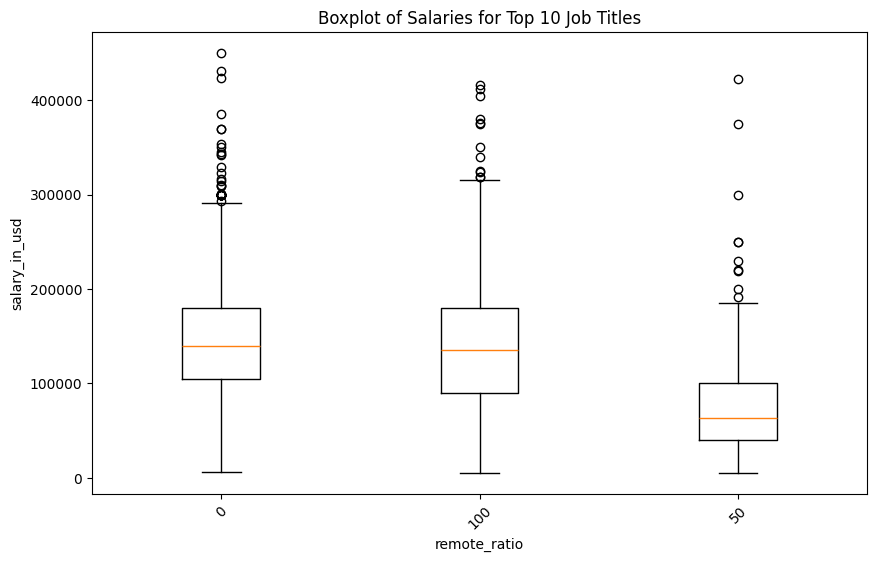

In [70]:
plot_boxplot(df, 'remote_ratio', 'salary_in_usd', top_n = 10)

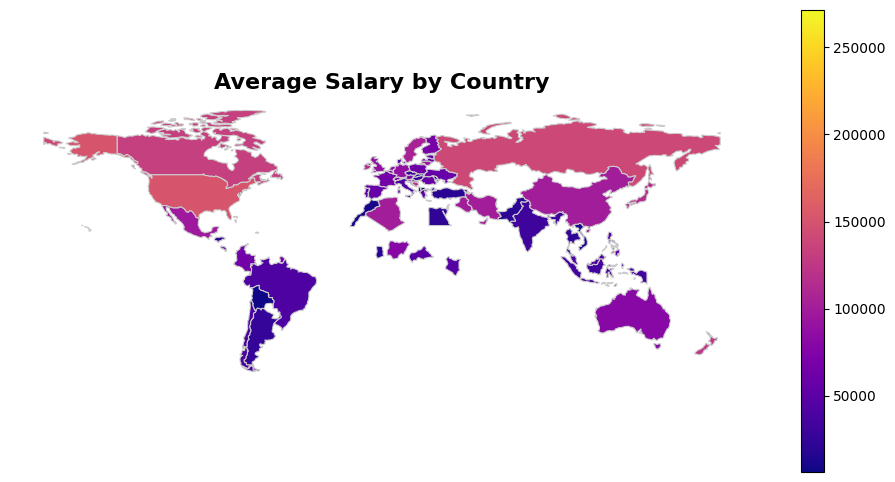

In [71]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

geo_df = df.copy()
geo_df['company_location'] = coco.convert(names=df['company_location'], to='ISO3')
average_salary_df = geo_df.groupby('company_location')['salary_in_usd'].mean().reset_index()
merged_data = world.merge(average_salary_df, left_on='iso_a3', right_on='company_location', how='left')

fig, ax = plt.subplots(figsize=(12, 6))
merged_data.plot(column='salary_in_usd', cmap='plasma', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

ax.set_title('Average Salary by Country', fontdict={'fontsize': '16', 'fontweight': 'bold'})
ax.set_axis_off()

plt.show()

In [72]:
sorted_average_salary_df = average_salary_df.sort_values(by='salary_in_usd', ascending=False)
sorted_average_salary_df.head(10)

,company_location,salary_in_usd
40,ISR,271446.500000
59,PRI,167500.000000
70,USA,151822.009539
62,RUS,140333.333333
13,CAN,131917.689655
55,NZL,125000.000000
9,BIH,120000.000000
37,IRL,114943.428571
42,JPN,114127.333333
66,SWE,105000.000000


In [73]:
def encode_categorical_columns(dataframe):
    cat_cols = ['experience_level', 'employment_type', 'job_title', 'employee_residence', 'remote_ratio', 'company_location', 'company_size']
    cols_to_drop = ['salary', 'salary_currency']
    
    new_dataframe = dataframe.drop(cat_cols + cols_to_drop, axis=1)
    
    encoders = {}
    
    for col in cat_cols:
        encoder = LabelEncoder()
        encoders[col] = encoder
        new_dataframe[col] = encoder.fit_transform(dataframe[col])
    return new_dataframe, encoders

In [74]:
clean_df, encoders = encode_categorical_columns(df)
clean_df.head()

,work_year,salary_in_usd,experience_level,employment_type,job_title,employee_residence,remote_ratio,company_location,company_size
0,2023,85847,3,2,84,26,2,25,0
1,2023,30000,2,0,66,75,2,70,2
2,2023,25500,2,0,66,75,2,70,2
3,2023,175000,3,2,47,11,2,12,1
4,2023,120000,3,2,47,11,2,12,1


In [75]:
def plot_correlation_matrix(dataframe):
    corr_matrix = dataframe.corr()

    mask = np.tril(np.ones_like(corr_matrix, dtype=bool))

    fig, ax = plt.subplots(figsize=(10, 8))

    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    sns.heatmap(corr_matrix, mask=mask, cmap=cmap, center=0,
                square=True, linewidths=0.5, cbar_kws={"shrink": 0.8},
                annot=True, fmt=".2f", annot_kws={"size": 10})

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)

    plt.title("Correlation Matrix")

    plt.show()

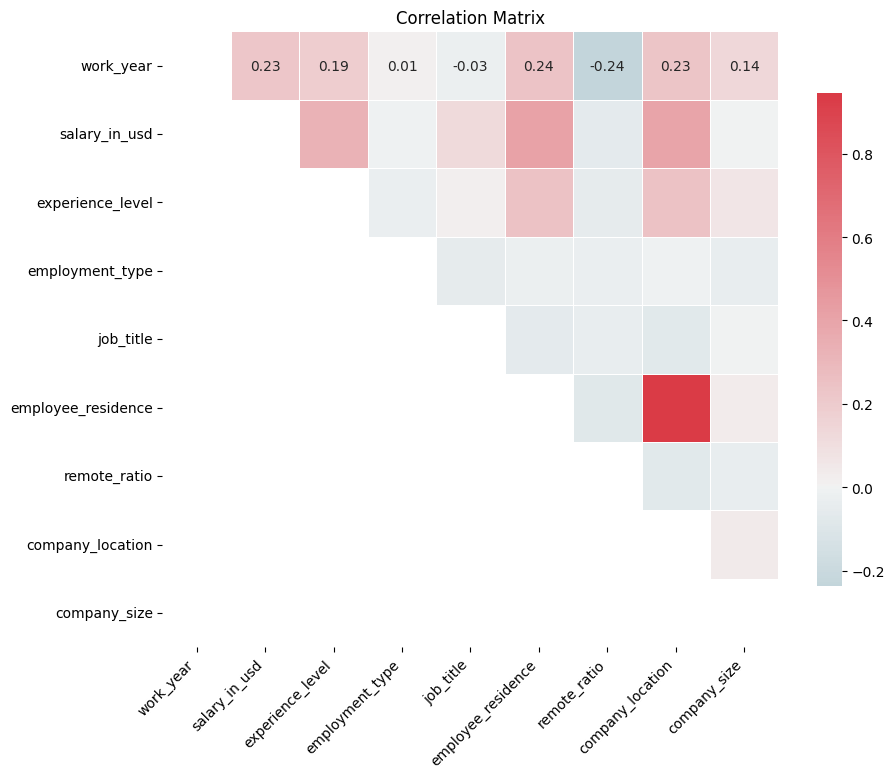

In [76]:
plot_correlation_matrix(clean_df)

In [77]:
def split_dataset(dataframe, target_column, test_size=0.2, validation_size=0.2, random_state=None):
    X = dataframe.drop(target_column, axis=1)
    y = dataframe[target_column]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    remaining_size = 1 - test_size
    validation_size_adjusted = validation_size / remaining_size

    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=validation_size_adjusted, random_state=random_state)

    return X_train, X_val, X_test, y_train, y_val, y_test

In [78]:
def standardize_data(train_X, train_y):
    scaler_x = StandardScaler()
    scaler_y = StandardScaler()

    train_X_standardized = scaler_x.fit_transform(train_X)
    train_y_array = np.array(train_y)
    train_y_standardized = scaler_y.fit_transform(train_y_array.reshape((-1,1)))

    return train_X_standardized, train_y_standardized, scaler_x, scaler_y

In [79]:
def standardize_test_data(test_X, test_y, scaler_X, scaler_y):
    test_X_standardized = scaler_X.transform(test_X)

    test_y_array = np.array(test_y)
    if len(test_y_array.shape) == 1:
        test_y_array = test_y_array.reshape(-1, 1)

    test_y_standardized = scaler_y.transform(test_y_array)

    test_y_standardized = test_y_standardized.flatten()

    return test_X_standardized, test_y_standardized

In [80]:
train_x, val_x, test_x, train_y, val_y, test_y = split_dataset(clean_df, 'salary_in_usd', random_state=42)
print(train_x.shape)
print(train_y.shape)
print(test_x.shape)
print(test_y.shape)
print(val_x.shape)
print(val_y.shape)

(2253, 8)
(2253,)
(751, 8)
(751,)
(751, 8)
(751,)


In [81]:
train_x_std, train_y_std, scaler_x, scaler_y = standardize_data(train_x, train_y)
test_x_std, test_y_std = standardize_test_data(test_x, test_y, scaler_x, scaler_y)
val_x_std, val_y_std = standardize_test_data(val_x, val_y, scaler_x, scaler_y)

In [82]:
lin_reg_model = LinearRegression()
lin_reg_model.fit(train_x_std, train_y_std)

LinearRegression()

In [83]:
y_pred = lin_reg_model.predict(test_x_std)

mse = mean_squared_error(test_y_std, y_pred)
print(mse)

0.7125812797509337


In [84]:
def predict_and_plot_difference(model, X_val, y_val, scaler):
    y_val_pred = model.predict(X_val)

    y_val_pred_original = scaler.inverse_transform(y_val_pred.reshape(-1, 1))
    y_val_original = scaler.inverse_transform(y_val.reshape(-1, 1))
    
    df_predictions = pd.DataFrame({'Actual': y_val_original.flatten(), 'Predicted': y_val_pred_original.flatten()})

    difference = df_predictions['Actual'] - df_predictions['Predicted']
    df_predictions['Difference'] = difference
    df_predictions['Difference in %'] = df_predictions['Difference']/df_predictions['Actual'] * 100

    plt.figure(figsize=(8, 6))
    plt.scatter(np.arange(len(difference)), difference, color='b')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Index')
    plt.ylabel('Difference')
    plt.title('Difference between Actual and Predicted Values')
    plt.show()

    return df_predictions, difference

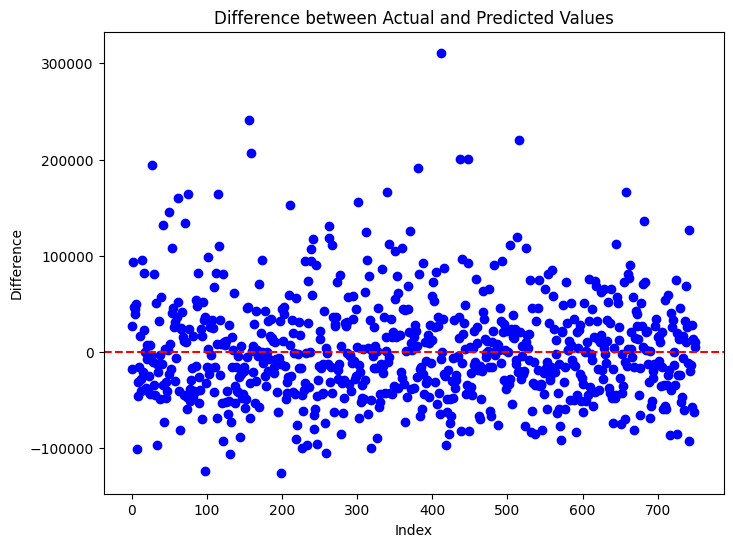

In [85]:
df_predictions, difference = predict_and_plot_difference(lin_reg_model, val_x_std, val_y_std, scaler_y)

In [86]:
df_predictions

,Actual,Predicted,Difference,Difference in %
0,88654.0,61855.843901,26798.156099,30.227803
1,120000.0,138067.734636,-18067.734636,-15.056446
2,230000.0,136761.797463,93238.202537,40.538349
3,202800.0,156236.152183,46563.847817,22.960477
4,185900.0,146301.446881,39598.553119,21.300997
...,...,...,...,...
746,185900.0,157765.944240,28134.055760,15.133973
747,160000.0,146301.446881,13698.553119,8.561596
748,53654.0,116544.603122,-62890.603122,-117.215125
749,154545.0,149557.174700,4987.825300,3.227426


In [87]:
train_x, val_x, test_x, train_y, val_y, test_y = split_dataset(clean_df, 'job_title', random_state=42)
print(train_x.shape)
print(train_y.shape)
print(test_x.shape)
print(test_y.shape)
print(val_x.shape)
print(val_y.shape)

(2253, 8)
(2253,)
(751, 8)
(751,)
(751, 8)
(751,)


In [88]:
train_x_std, train_y_std, scaler_x, scaler_y = standardize_data(train_x, train_y)
test_x_std, test_y_std = standardize_test_data(test_x, test_y, scaler_x, scaler_y)
val_x_std, val_y_std = standardize_test_data(val_x, val_y, scaler_x, scaler_y)

In [89]:
def get_new_model(input_shape):
    model = Sequential([
        Dense(150, input_shape = input_shape[1:], activation = 'relu', name = 'layer1'),
        Dense(150, activation = 'relu'),
        Dense(140, activation = 'relu'),
        Dense(130, activation = 'relu'),
        Dense(130, activation = 'relu'),
        Dense(120, activation = 'relu'),
        Dense(93, activation='softmax')
    ])
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

In [90]:
model = get_new_model(train_x.shape)
model.summary()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 150)               1350      
                                                                 
 dense (Dense)               (None, 150)               22650     
                                                                 
 dense_1 (Dense)             (None, 140)               21140     
                                                                 
 dense_2 (Dense)             (None, 130)               18330     
                                                                 
 dense_3 (Dense)             (None, 130)               17030     
                                                                 
 dense_4 (Dense)             (None, 120)               15720     
                                                                 
 dense_5 (Dense)             (None, 93)               

In [91]:
history = model.fit(train_x_std, train_y, validation_data = (test_x_std, test_y), epochs=100, batch_size=30)

Epoch 1/100


76/76 [==============================] - 2s 10ms/step - loss: 2.9470 - accuracy: 0.2508 - val_loss: 2.5511 - val_accuracy: 0.2583
Epoch 2/100
76/76 [==============================] - 0s 4ms/step - loss: 2.3983 - accuracy: 0.2894 - val_loss: 2.5307 - val_accuracy: 0.2770
Epoch 3/100
76/76 [==============================] - 0s 3ms/step - loss: 2.3417 - accuracy: 0.2898 - val_loss: 2.5403 - val_accuracy: 0.2690
Epoch 4/100
76/76 [==============================] - 0s 4ms/step - loss: 2.2916 - accuracy: 0.3005 - val_loss: 2.4516 - val_accuracy: 0.2863
Epoch 5/100
76/76 [==============================] - 0s 3ms/step - loss: 2.2407 - accuracy: 0.3218 - val_loss: 2.4748 - val_accuracy: 0.3009
Epoch 6/100
76/76 [==============================] - 0s 3ms/step - loss: 2.1901 - accuracy: 0.3227 - val_loss: 2.4416 - val_accuracy: 0.3156
Epoch 7/100
76/76 [==============================] - 0s 3ms/step - loss: 2.1645 - accuracy: 0.3347 - val_loss: 2.4393 - val_accuracy: 0.3262
Epoch 8/10

In [92]:
def get_top_5_predictions(model, x, actual_y, encoder):
    print(f"The actual job_title is: {encoder.inverse_transform(actual_y.reshape(1,))}")
    print(f"The top 5 job_titles predicted by the model is: ")
    preds = model.predict(np.reshape(x, (1, -1)))
    top_preds = pd.DataFrame(columns=['prediction'],
                             index=np.arange(5)+1)
    sorted_index = np.argsort(-preds[0])
    for i in range(5):
        ith_pred = encoder.inverse_transform(sorted_index[i].reshape(1,))
        top_preds.loc[i+1, 'prediction'] = ith_pred
    return top_preds

In [93]:
def random_index(upper_bound):
    return random.randint(0, upper_bound)
random_idx = random_index(val_x_std.shape[0] - 1)
get_top_5_predictions(model, val_x_std[random_idx], val_y.iloc[random_idx], encoders['job_title'])

The actual job_title is: ['Data Scientist']
The top 5 job_titles predicted by the model is: 
1/1 [==============================] - 0s 135ms/step


,prediction
1,Data Engineer
2,Data Analyst
3,Analytics Engineer
4,Data Scientist
5,Data Specialist


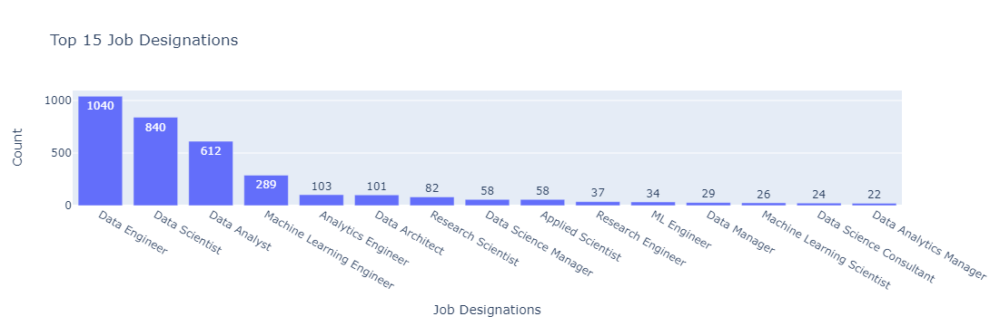

In [94]:
top15_job_titles = df['job_title'].value_counts()[:15]
fig = px.bar(y = top15_job_titles.values, x = top15_job_titles.index, 
            text = top15_job_titles.values, title = 'Top 15 Job Designations')
fig.update_layout(xaxis_title = "Job Designations", yaxis_title = "Count")
fig.show()

In [95]:
def Freq_df(word_list):
    Freq_dist_nltk = nltk.FreqDist(word_list)
    df_freq = pd.DataFrame.from_dict(Freq_dist_nltk, orient = 'index')
    df_freq.columns = ['Frequency']
    df_freq.index.name = 'Term'
    df_freq = df_freq.sort_values(by = ['Frequency'], ascending = False)
    df_freq = df_freq.reset_index()
    return df_freq

In [96]:
def Word_Cloud(data, title):
    plt.figure(figsize = (20,15))
    wc = WordCloud(width = 1200, height = 600, max_words = 50,
               background_color = 'white',
               max_font_size = 100, random_state = 42)
    wc.generate_from_frequencies(data)
    
    plt.imshow(wc)
    plt.title(title)
    plt.axis('off')
    plt.show()

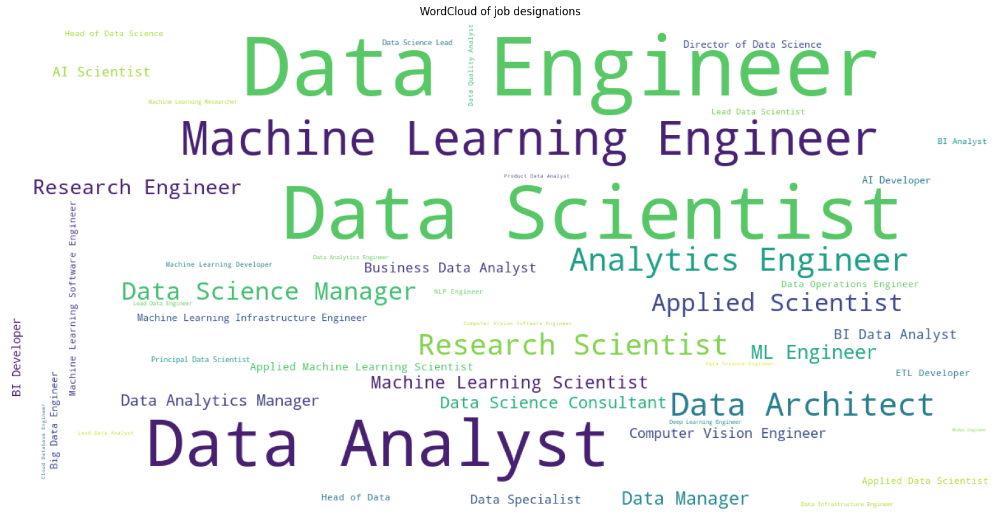

In [97]:
def Word_Cloud(data, title):
    plt.figure(figsize = (20,15))
    wc = WordCloud(width = 1200, height = 600, max_words = 50,
               background_color = 'white',
               max_font_size = 100, random_state = 42)
    wc.generate_from_frequencies(data)
    
    plt.imshow(wc)
    plt.title(title)
    plt.axis('off')
    plt.show()
freq_df = Freq_df(df['job_title'].values.tolist())
data = dict(zip(freq_df['Term'].tolist(), freq_df['Frequency'].tolist()))
data = freq_df.set_index('Term').to_dict()['Frequency']

Word_Cloud(data , 'WordCloud of job designations')

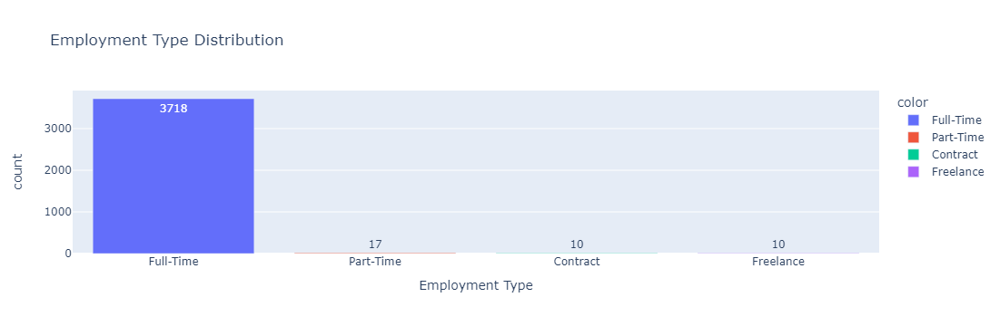

In [98]:
group = df['employment_type'].value_counts()
emp_type = ['Full-Time', 'Part-Time', 'Contract', 'Freelance']

fig = px.bar(x = emp_type, y = group.values, 
       color = group.index, text = group.values, 
       title = 'Employment Type Distribution')

fig.update_layout( xaxis_title = "Employment Type", yaxis_title = "count")
fig.show()

In [99]:
country = coco.convert(names = df['employee_residence'], to = "ISO3")
df['employee_residence'] = country

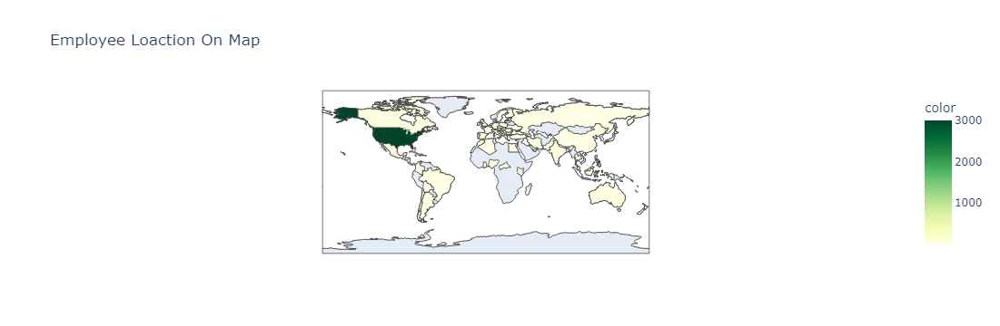

In [100]:
residence = df['employee_residence'].value_counts()
fig = px.choropleth(locations = residence.index,
                    color = residence.values,
                    color_continuous_scale=px.colors.sequential.YlGn,
                    title = 'Employee Loaction On Map')
fig.show()

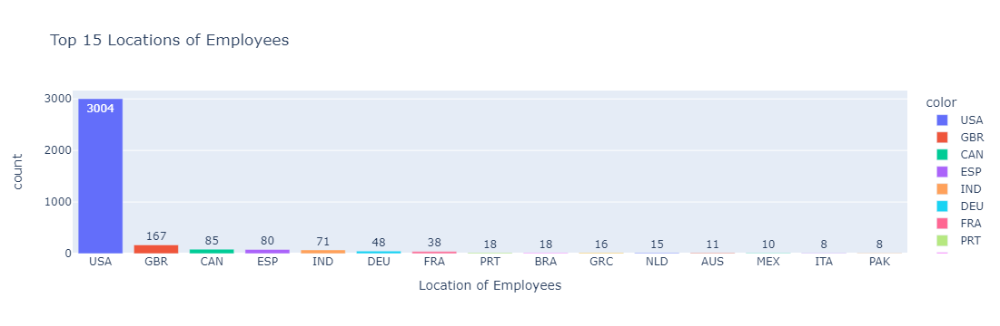

In [101]:
top_15_emp_locations = residence[:15]
fig = px.bar(y = top_15_emp_locations.values, x = top_15_emp_locations.index, 
            color = top_15_emp_locations.index, text = top_15_emp_locations.values,
            title = 'Top 15 Locations of Employees')

fig.update_layout( xaxis_title = "Location of Employees", yaxis_title = "count")
fig.show()

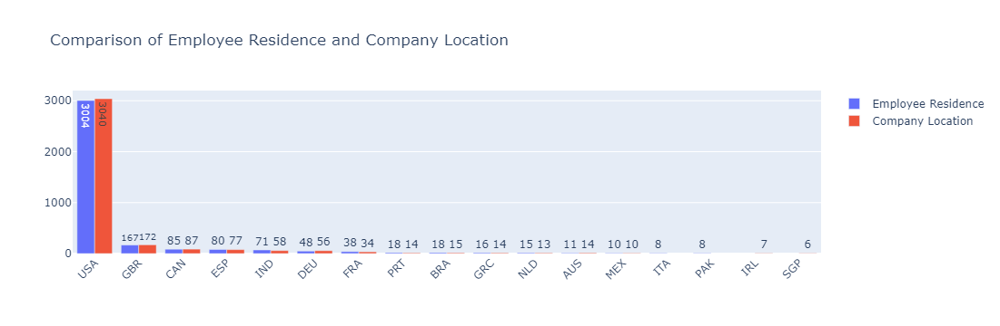

In [102]:
country = coco.convert(names=df['company_location'], to="ISO3")
df['company_location'] = country
company_location = df['company_location'].value_counts()
top_15_company_location = company_location[:15]

fig = go.Figure(data = [
    go.Bar(name = 'Employee Residence', 
           x = top_15_emp_locations.index, y = top_15_emp_locations.values,
           text = top_15_emp_locations.values),
    go.Bar(name = 'Company Location', x = top_15_company_location.index, 
           y = top_15_company_location.values, text = top_15_company_location.values)])

fig.update_layout(barmode = 'group', xaxis_tickangle = -45,
                  title='Comparison of Employee Residence and Company Location')

fig.show()

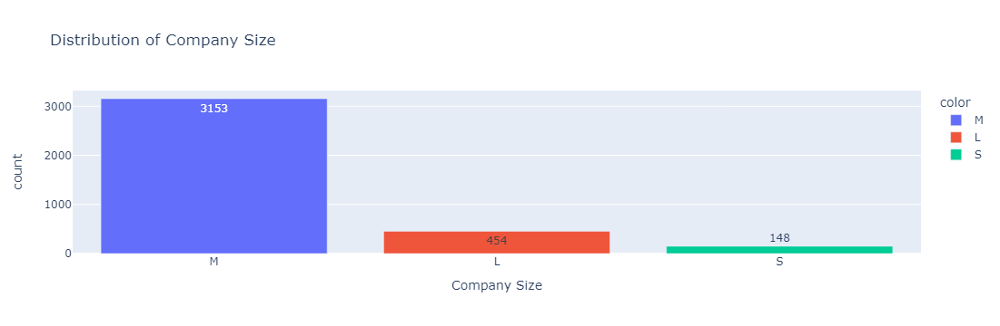

In [103]:
group = df['company_size'].value_counts()

fig = px.bar(y = group.values, x = group.index, 
             color = group.index, text = group.values,
             title = 'Distribution of Company Size')

fig.update_layout(xaxis_title = "Company Size", yaxis_title = "count")
fig.show()

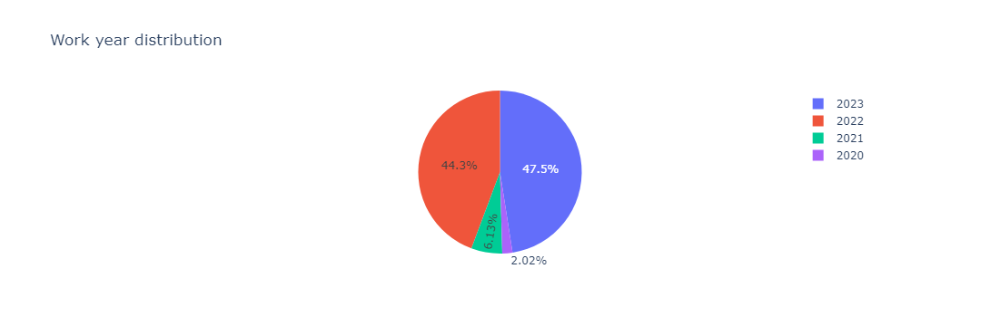

In [104]:
work_year = df['work_year'].value_counts()
fig = px.pie(values = work_year.values, names = work_year.index, 
            title = 'Work year distribution')
fig.show()

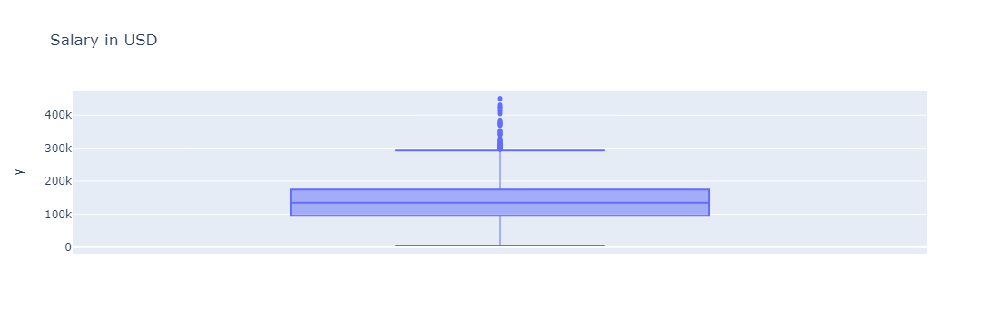

In [105]:
fig = px.box(y = df['salary_in_usd'], title = 'Salary in USD')
fig.show()

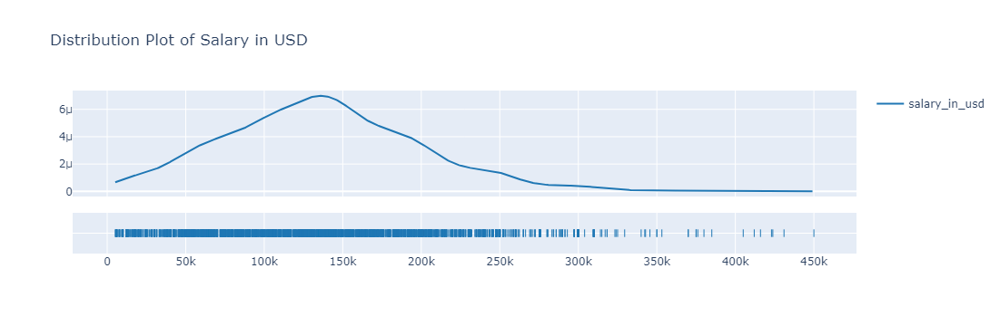

In [106]:
hist_data = [df['salary_in_usd']]
group_labels = ['salary_in_usd']

fig = ff.create_distplot(hist_data, group_labels, show_hist = False)
fig.update_layout(title = 'Distribution Plot of Salary in USD') 
fig.show()

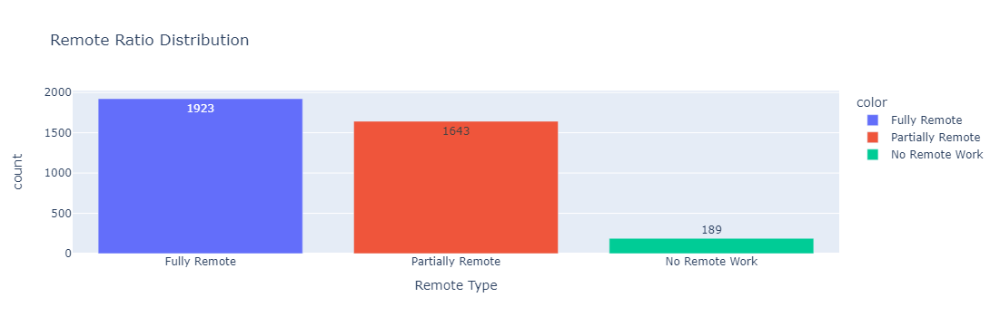

In [107]:
remote_type = ['Fully Remote', 'Partially Remote', 'No Remote Work']

fig = px.bar(x = remote_type, y = df['remote_ratio'].value_counts().values,
       color = remote_type, text = df['remote_ratio'].value_counts().values,
       title = 'Remote Ratio Distribution')

fig.update_layout( xaxis_title = "Remote Type", yaxis_title = "count")
fig.show()

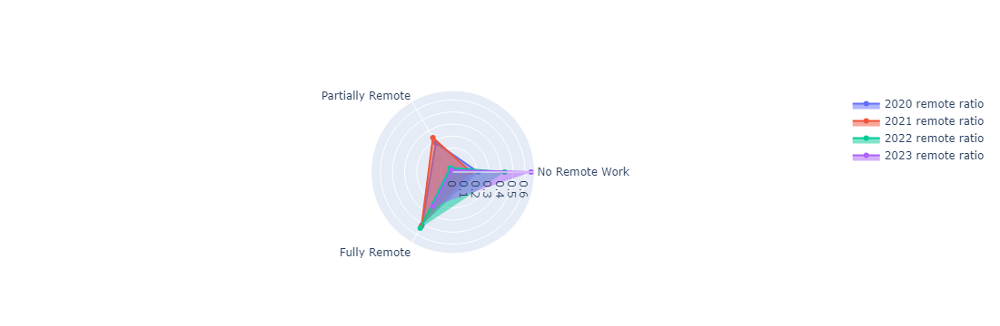

In [108]:
remote_year = df.groupby(['work_year','remote_ratio']).size()
ratio_2020 = np.round(remote_year[2020].values/remote_year[2020].values.sum(),2)
ratio_2021 = np.round(remote_year[2021].values/remote_year[2021].values.sum(),2)
ratio_2022 = np.round(remote_year[2022].values/remote_year[2022].values.sum(),2)
ratio_2023 = np.round(remote_year[2023].values/remote_year[2023].values.sum(),2)

fig = go.Figure()
categories = ['No Remote Work', 'Partially Remote', 'Fully Remote']
fig.add_trace(go.Scatterpolar(
            r = ratio_2020, theta = categories, 
            fill = 'toself', name = '2020 remote ratio'))

fig.add_trace(go.Scatterpolar(
            r = ratio_2021, theta = categories,
            fill = 'toself', name = '2021 remote ratio'))

fig.add_trace(go.Scatterpolar(
            r = ratio_2022, theta = categories,
            fill = 'toself', name = '2022 remote ratio'))

fig.add_trace(go.Scatterpolar(
            r = ratio_2023, theta = categories,
            fill = 'toself', name = '2023 remote ratio'))

fig.show()

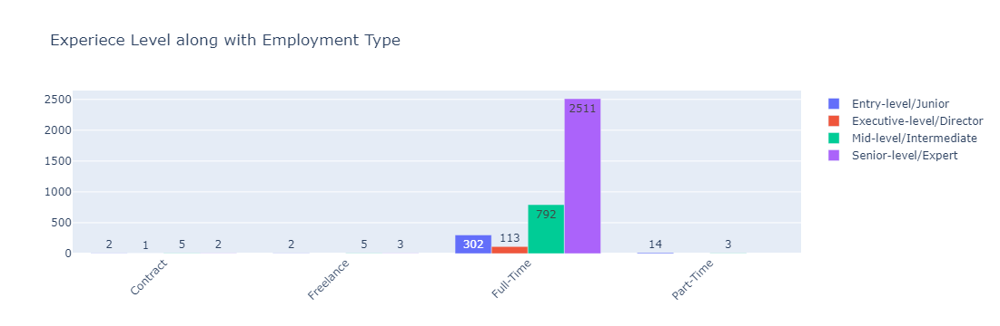

In [109]:
exp_type = df.groupby(['experience_level','employment_type']).size()

fig = go.Figure(data = [
    go.Bar(name = 'Entry-level/Junior', x = exp_type['Entry-level/Junior'].index, 
           y = exp_type['Entry-level/Junior'].values, text = exp_type['Entry-level/Junior'].values),
    go.Bar(name = 'Executive-level/Director', x = exp_type['Executive-level/Director'].index, 
           y = exp_type['Executive-level/Director'].values, text = exp_type['Executive-level/Director'].values),
    go.Bar(name = 'Mid-level/Intermediate', x = exp_type['Mid-level/Intermediate'].index,
           y = exp_type['Mid-level/Intermediate'].values, text = exp_type['Mid-level/Intermediate'].values),
    go.Bar(name = 'Senior-level/Expert', x = exp_type['Senior-level/Expert'].index,
           y = exp_type['Senior-level/Expert'].values, text = exp_type['Senior-level/Expert'].values)])

fig.update_layout(xaxis_tickangle = -45, title = 'Experiece Level along with Employment Type')

fig.show()

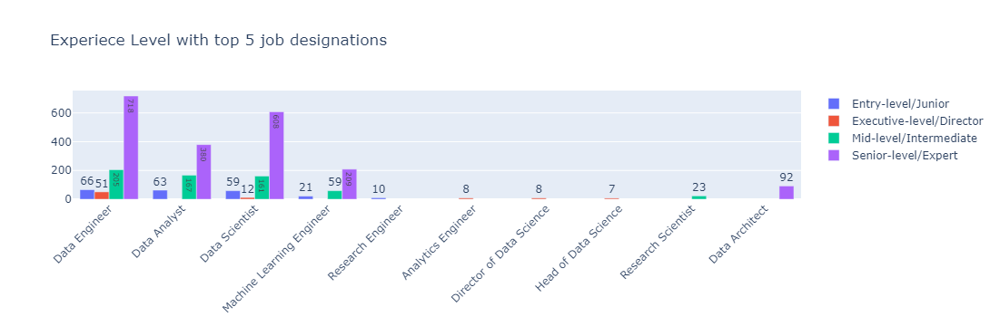

In [110]:
exp_job = df.groupby(['experience_level','job_title']).size()

entry_top5 = exp_job['Entry-level/Junior'].sort_values(ascending = False)[:5]
executive_top5 = exp_job['Executive-level/Director'].sort_values(ascending = False)[:5]
mid_top5 = exp_job['Mid-level/Intermediate'].sort_values(ascending = False)[:5]
senior_top5 = exp_job['Senior-level/Expert'].sort_values(ascending = False)[:5]

exp_type = df.groupby(['experience_level','employment_type']).size()

fig = go.Figure(data=[
    go.Bar(name = 'Entry-level/Junior', x = entry_top5.index, 
           y=entry_top5.values, text = entry_top5.values),
    go.Bar(name = 'Executive-level/Director', x = executive_top5.index,
           y = executive_top5.values, text = executive_top5.values),
    go.Bar(name = 'Mid-level/Intermediate', x = mid_top5.index,
           y = mid_top5.values, text = mid_top5.values ),
    go.Bar(name = 'Senior-level/Expert', x = senior_top5.index,
           y = senior_top5.values, text = senior_top5.values)])

fig.update_layout(xaxis_tickangle = -45, title = 'Experiece Level with top 5 job designations')
fig.show()

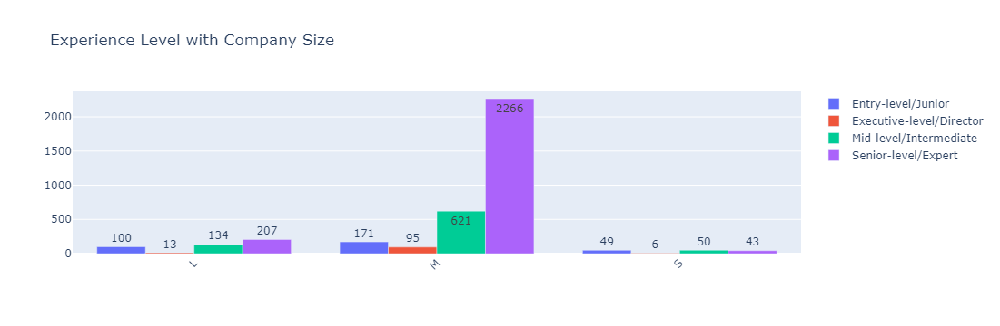

In [111]:
exp_size = df.groupby(['experience_level','company_size']).size()
fig = go.Figure(data = [
    go.Bar(name = 'Entry-level/Junior', x = exp_size['Entry-level/Junior'].index,
           y = exp_size['Entry-level/Junior'].values, text = exp_size['Entry-level/Junior'].values),
    go.Bar(name = 'Executive-level/Director', x = exp_size['Executive-level/Director'].index,
           y = exp_size['Executive-level/Director'].values, text = exp_size['Executive-level/Director'].values),
    go.Bar(name = 'Mid-level/Intermediate', x = exp_size['Mid-level/Intermediate'].index,
           y = exp_size['Mid-level/Intermediate'].values, text = exp_size['Mid-level/Intermediate'].values),
    go.Bar(name = 'Senior-level/Expert', x = exp_size['Senior-level/Expert'].index,
           y = exp_size['Senior-level/Expert'].values, text = exp_size['Senior-level/Expert'].values),
])
fig.update_layout(xaxis_tickangle = -45, title = 'Experience Level with Company Size')

fig.show()

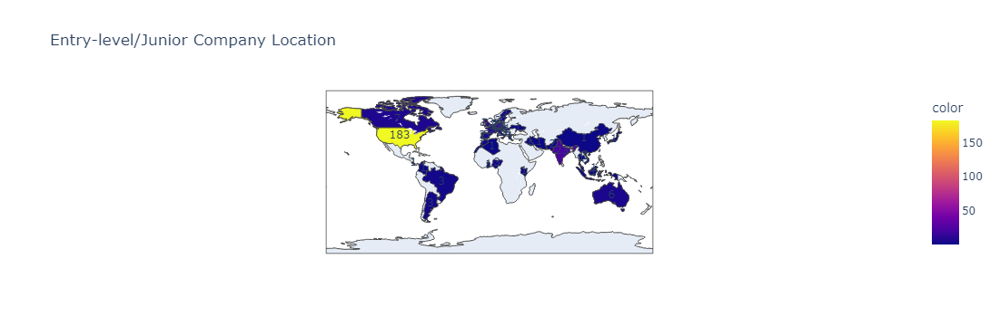

In [112]:
exp_location = df.groupby(['experience_level','company_location']).size()

entry_location = exp_location['Entry-level/Junior']
executive_location = exp_location['Executive-level/Director']
mid_location = exp_location['Mid-level/Intermediate']
senior_location = exp_location['Senior-level/Expert']

fig1 = px.choropleth(locations = entry_location.index, color = entry_location.values,
                    title = 'Entry-level/Junior Company Location')

fig2 = px.choropleth(locations = mid_location.index, color = mid_location.values,
                    title = 'Mid-level/Intermediate Company Location')

fig3 = px.choropleth(locations = senior_location.index, color = senior_location.values,
                    title = 'Senior-level/Expert Company Location')

fig4 = px.choropleth(locations = executive_location.index, color = executive_location.values,
                    title = 'Executive-level/Director Company Location')

fig1.add_scattergeo(locations = entry_location.index, text = entry_location.values,  mode = 'text')
fig2.add_scattergeo(locations = mid_location.index, text = mid_location.values,  mode = 'text')
fig3.add_scattergeo(locations = senior_location.index, text = senior_location.values, mode = 'text')
fig4.add_scattergeo(locations = executive_location.index, text = executive_location.values,  mode = 'text')

fig1.show()

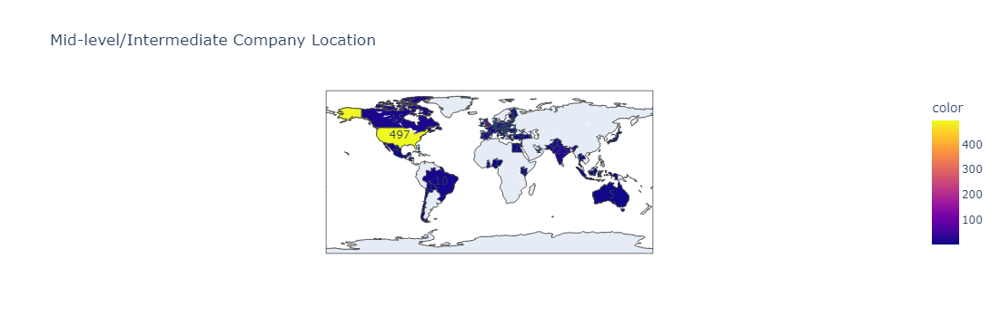

In [113]:
fig2.show()

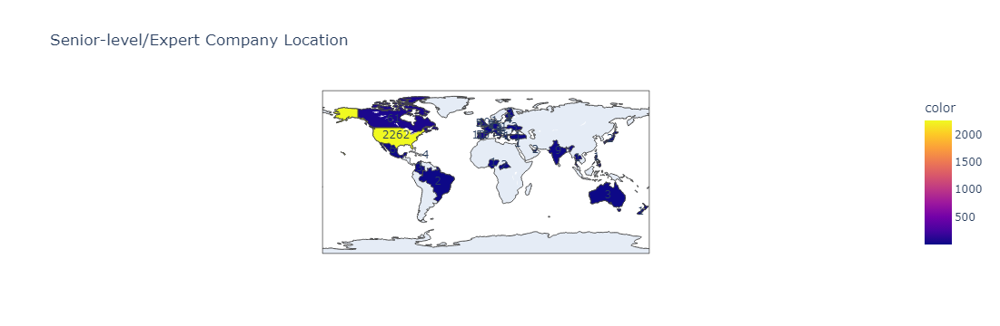

In [114]:
fig3.show()

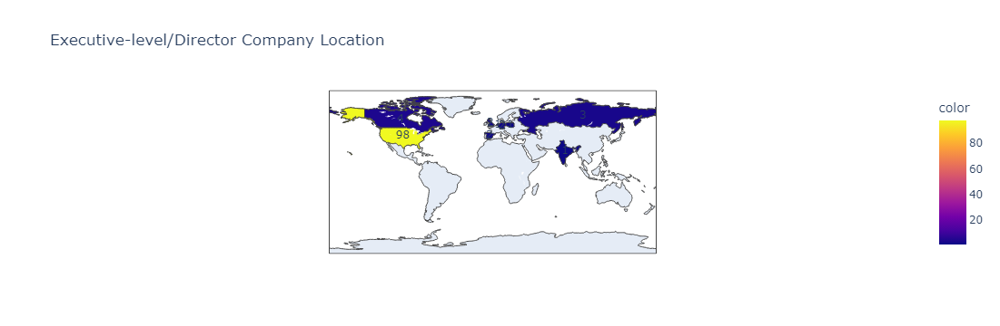

In [115]:
fig4.show()

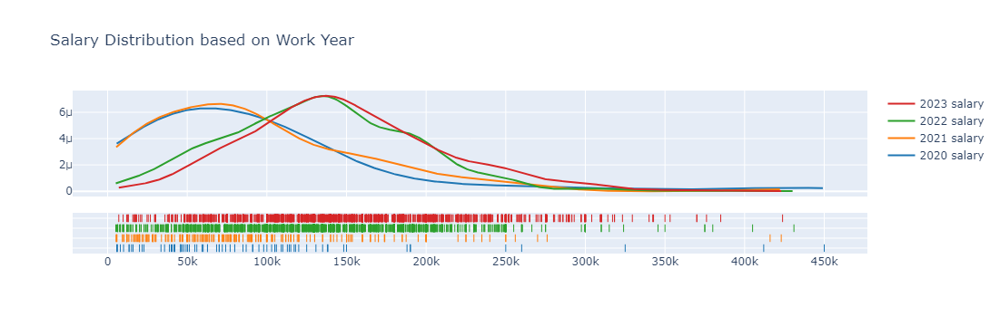

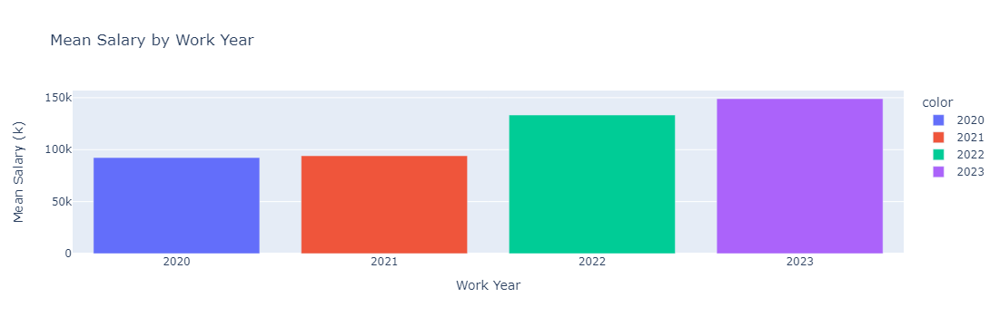

In [116]:
work_2020 = df.loc[(df['work_year'] == 2020)]
work_2021 = df.loc[(df['work_year'] == 2021)]
work_2022 = df.loc[(df['work_year'] == 2022)]
work_2023 = df.loc[(df['work_year'] == 2023)]
 
hist_data = [work_2020['salary_in_usd'], work_2021['salary_in_usd'], 
            work_2022['salary_in_usd'], work_2023['salary_in_usd']]
group_labels = ['2020 salary', '2021 salary', '2022 salary', '2023 salary']

year_salary = pd.DataFrame(columns = ['2020', '2021', '2022', '2023'])
year_salary['2020'] = work_2020.groupby('work_year').mean('salary_in_usd')['salary_in_usd'].values
year_salary['2021'] = work_2021.groupby('work_year').mean('salary_in_usd')['salary_in_usd'].values
year_salary['2022'] = work_2022.groupby('work_year').mean('salary_in_usd')['salary_in_usd'].values
year_salary['2023'] = work_2023.groupby('work_year').mean('salary_in_usd')['salary_in_usd'].values

fig1 = ff.create_distplot(hist_data, group_labels, show_hist = False)
fig2 = go.Figure(data=px.bar(x = year_salary.columns, 
                            y = year_salary.values.tolist()[0],
                            color = year_salary.columns,
                            title = 'Mean Salary by Work Year'))

fig1.update_layout(title = 'Salary Distribution based on Work Year')
fig2.update_layout(xaxis_title = "Work Year", yaxis_title = "Mean Salary (k)")
fig1.show()
fig2.show()

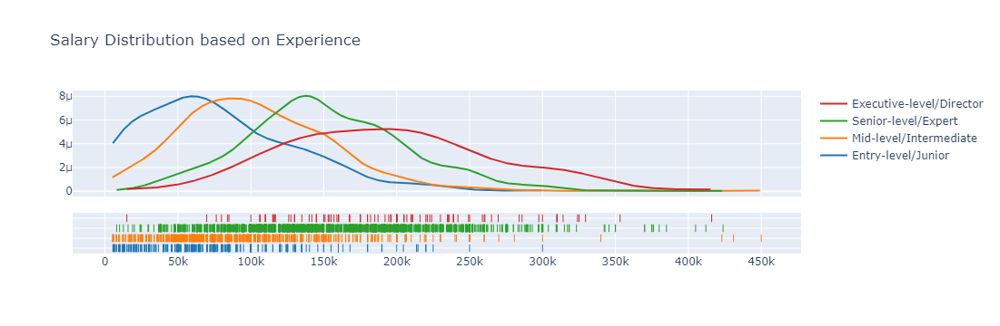

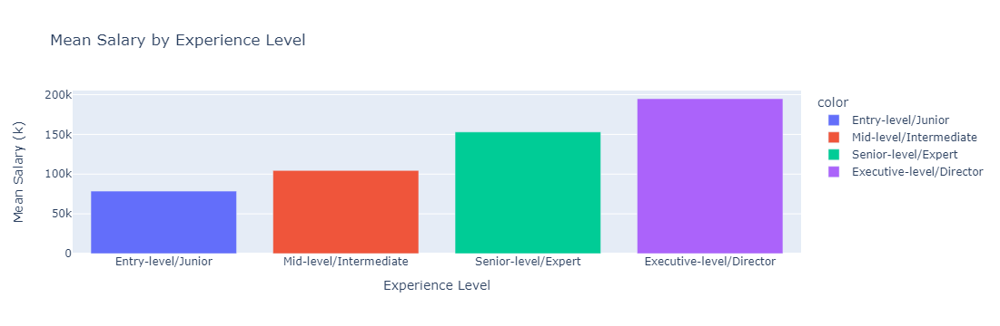

In [117]:
exp_salary = df[['experience_level','salary_in_usd']]

entry_salary = exp_salary.loc[exp_salary['experience_level'] == 'Entry-level/Junior']
executive_salary = exp_salary.loc[exp_salary['experience_level'] == 'Executive-level/Director']
mid_salary = exp_salary.loc[exp_salary['experience_level'] == 'Mid-level/Intermediate']
senior_salary = exp_salary.loc[exp_salary['experience_level'] == 'Senior-level/Expert']

hist_data = [entry_salary['salary_in_usd'], mid_salary['salary_in_usd'], senior_salary['salary_in_usd'], executive_salary['salary_in_usd']]
group_labels = ['Entry-level/Junior', 'Mid-level/Intermediate', 'Senior-level/Expert', 'Executive-level/Director']

means = [entry_salary['salary_in_usd'].mean(), mid_salary['salary_in_usd'].mean(),
    senior_salary['salary_in_usd'].mean(), executive_salary['salary_in_usd'].mean(),]

fig1 = ff.create_distplot(hist_data, group_labels, show_hist = False)
fig2 = go.Figure(data=px.bar(x = group_labels, y = means, color = group_labels,
                            title = 'Mean Salary by Experience Level'))
                            
fig1.update_layout(title = 'Salary Distribution based on Experience')
fig2.update_layout(xaxis_title = "Experience Level", yaxis_title = "Mean Salary (k) ")
fig1.show()
fig2.show()

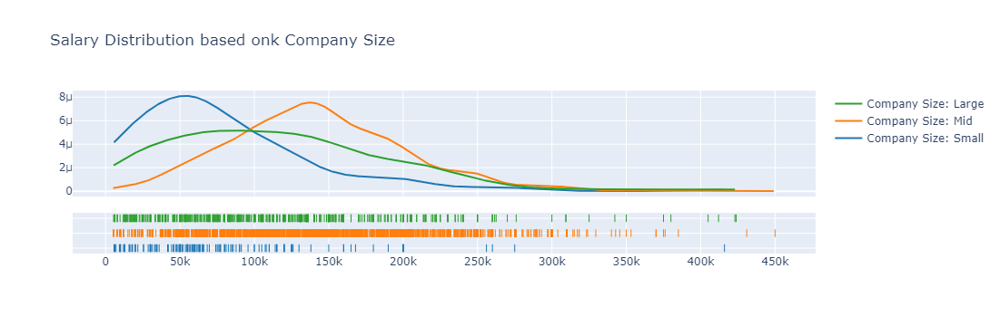

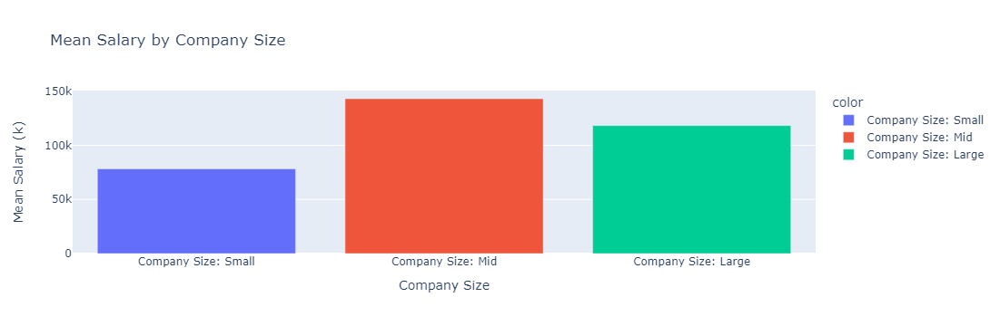

In [118]:
company_size = df[['company_size','salary_in_usd']]
small = exp_salary.loc[company_size['company_size'] == 'S']
mid = exp_salary.loc[company_size['company_size'] == 'M']
large = exp_salary.loc[company_size['company_size'] == 'L']
hist_data = [small['salary_in_usd'], mid['salary_in_usd'], large['salary_in_usd']]
group_labels = ['Company Size: Small', 'Company Size: Mid', 'Company Size: Large']

means = [small['salary_in_usd'].mean(), mid['salary_in_usd'].mean(), large['salary_in_usd'].mean()]

fig1 = ff.create_distplot(hist_data, group_labels, show_hist = False)
fig2 = go.Figure(data = px.bar(x = group_labels, y = means, color = group_labels,
                title = 'Mean Salary by Company Size'))

fig1.update_layout(title = 'Salary Distribution based onk Company Size')
fig2.update_layout( xaxis_title = "Company Size", yaxis_title = "Mean Salary (k)")
fig1.show()
fig2.show()

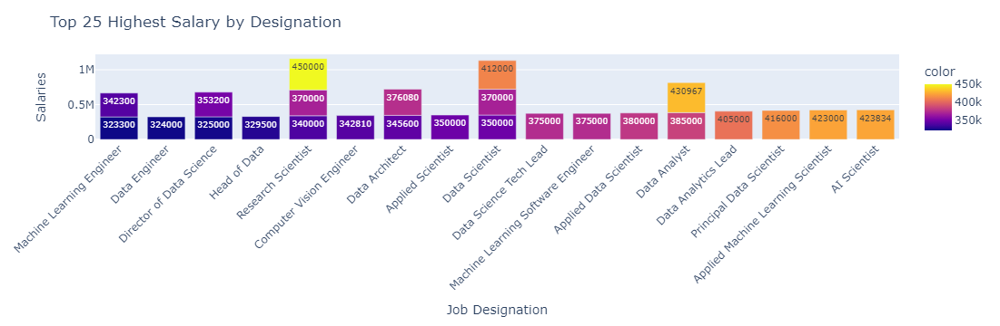

In [119]:
salary_designation = df.groupby(['salary_in_usd', 'job_title']).size().reset_index()
salary_designation = salary_designation[-25:]
fig = px.bar(x = salary_designation['job_title'], y = salary_designation['salary_in_usd'],
            text = salary_designation['salary_in_usd'], color = salary_designation['salary_in_usd'])

fig.update_layout( xaxis_title = "Job Designation", yaxis_title = "Salaries ")
fig.update_layout(xaxis_tickangle = -45, 
                  title = 'Top 25 Highest Salary by Designation')

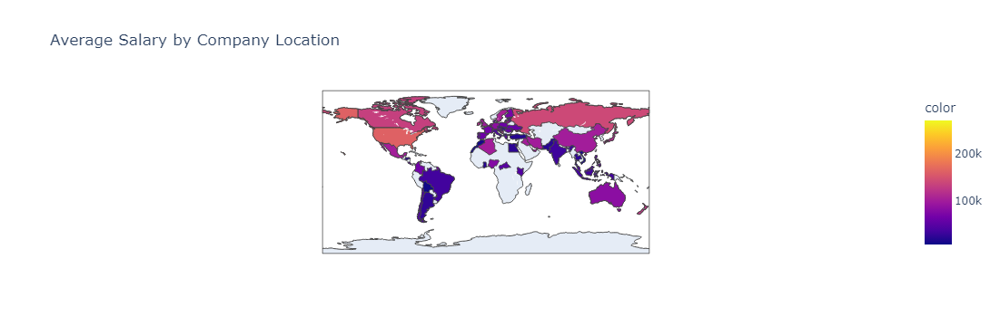

In [120]:
salary_location = df.groupby(['salary_in_usd', 'company_location']).size().reset_index()
means = salary_location.groupby('company_location').mean().reset_index()

fig = px.choropleth(locations = means['company_location'], color = means['salary_in_usd'],
                    title = 'Average Salary by Company Location')
fig.show()

In [121]:
df.drop(df[['salary','salary_currency']], axis = 1, inplace = True)

ValueError: could not convert string to float: 'Senior-level/Expert'

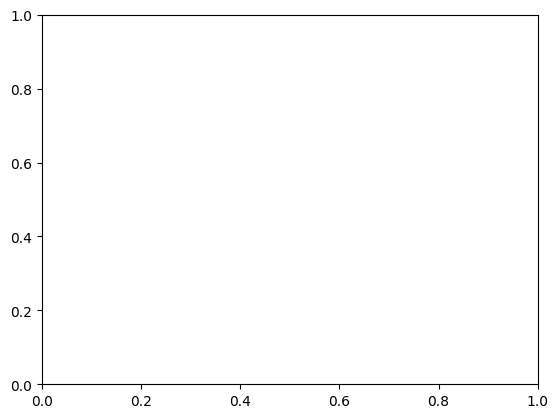

In [122]:
fig, ax = plt.subplots() 
sns.heatmap(df.corr(), annot = True)
plt.title('Confusion Matrix')

Text(0.5, 0, 'Salary paid Year')

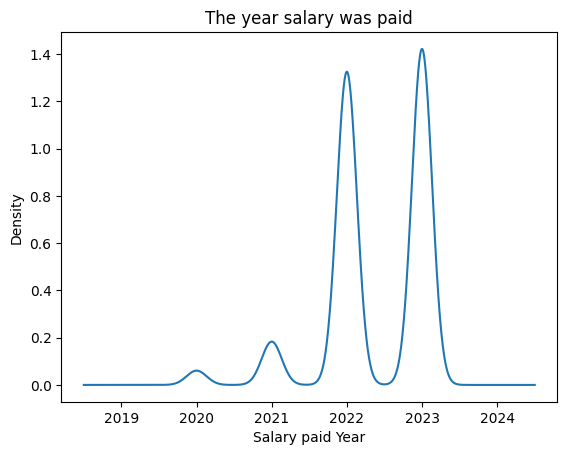

In [123]:
ax=df['work_year'].plot(kind='kde',title="The year salary was paid")
ax.set_xlabel("Salary paid Year")

Text(0.5, 0, 'Experience Level')

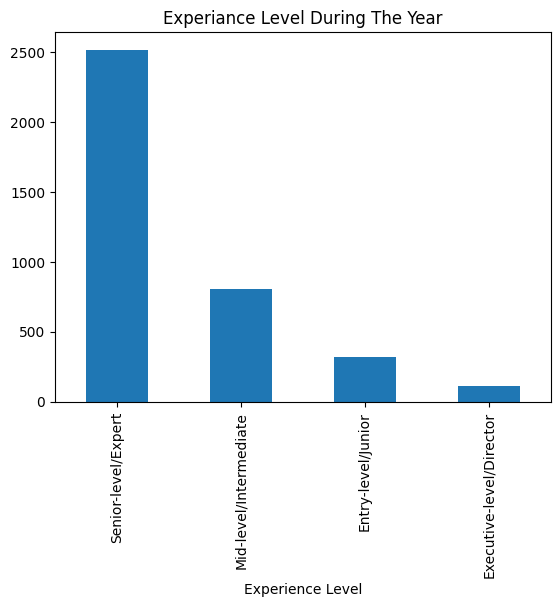

In [124]:
#experience_level: The experience level in the job during the year
ax=df['experience_level'].value_counts().plot(kind='bar',title="Experiance Level During The Year")
ax.set_xlabel("Experience Level")

Text(0.5, 0, 'Employment Type')

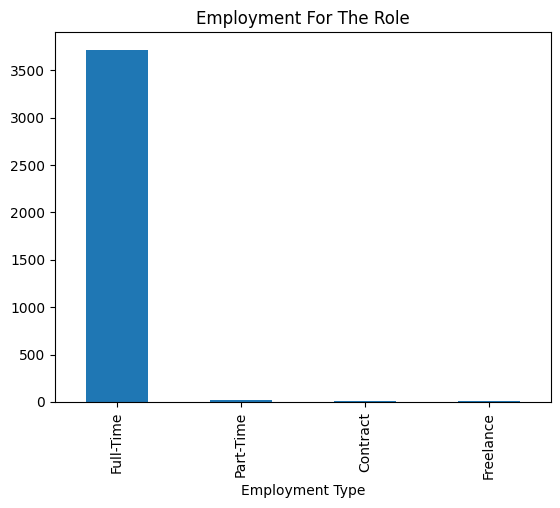

In [125]:
ax=df['employment_type'].value_counts().plot(kind='bar',title="Employment For The Role")
ax.set_xlabel("Employment Type")

Text(0.5, 0, 'Job Role')

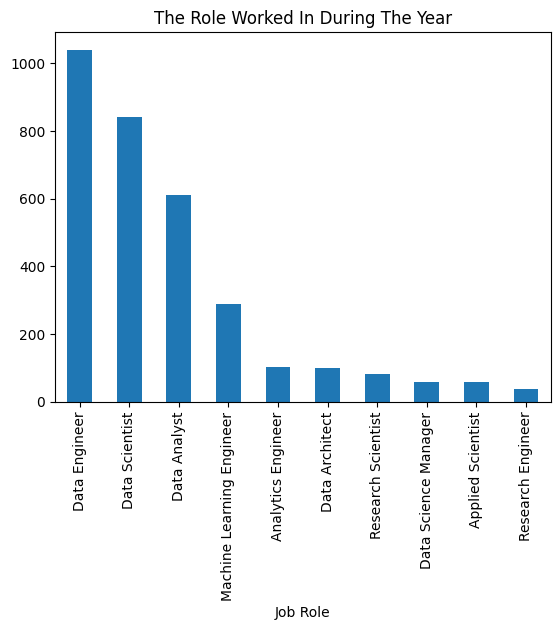

In [126]:
ax=df['job_title'].value_counts().head(10).plot(kind='bar',title="The Role Worked In During The Year")
ax.set_xlabel("Job Role")

Text(0.5, 0, 'Salary')

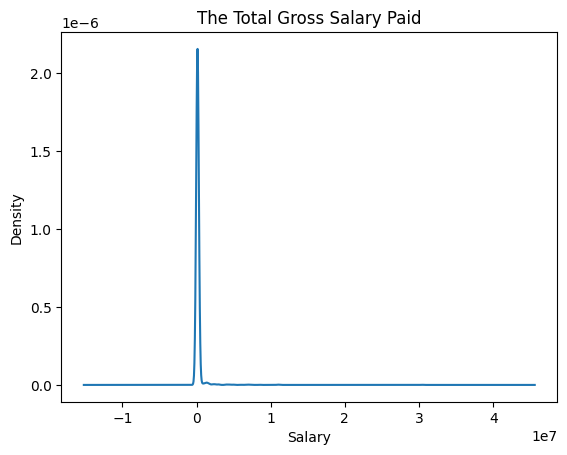

In [127]:
ax=data2['salary'].plot(kind='kde',title="The Total Gross Salary Paid")
ax.set_xlabel("Salary")

Text(0.5, 0, 'Salary Currency Paid')

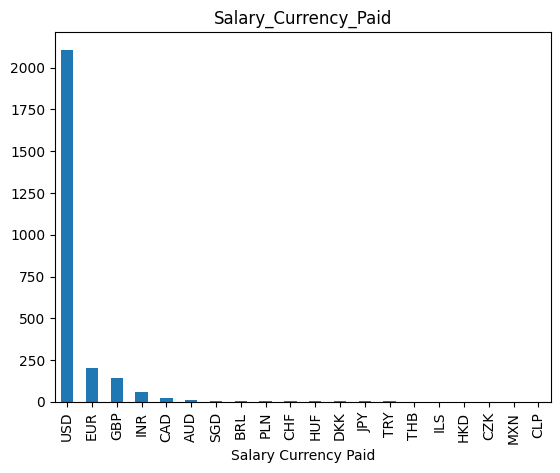

In [128]:
ax=data2['salary_currency'].value_counts().plot(kind='bar',title="Salary_Currency_Paid")
ax.set_xlabel("Salary Currency Paid")

Text(0.5, 0, 'Salary In USD')

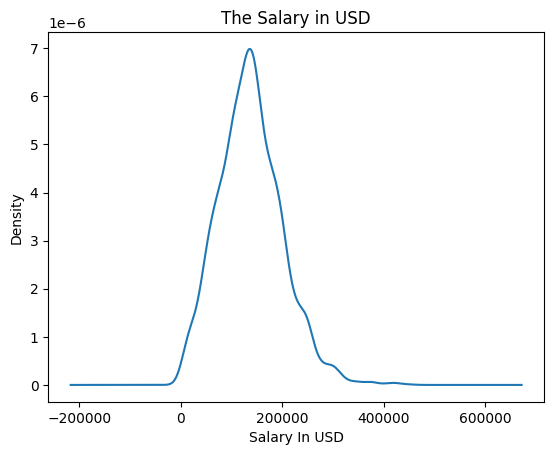

In [129]:
ax=df['salary_in_usd'].plot(kind='kde',title="The Salary in USD")
ax.set_xlabel("Salary In USD")

Text(0.5, 0, 'Employees Country Of Residence ')

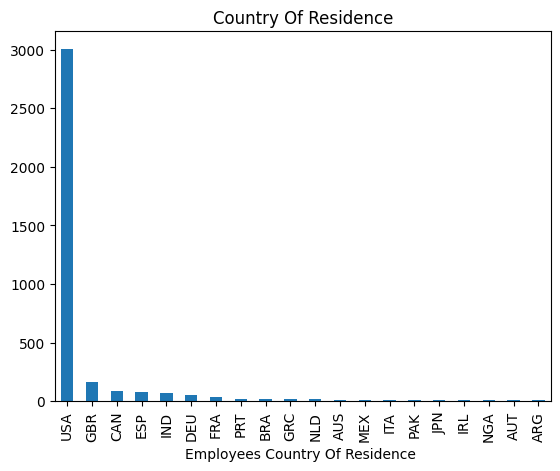

In [130]:
ax=df['employee_residence'].value_counts().head(20).plot(kind='bar',title="Country Of Residence")
ax.set_xlabel("Employees Country Of Residence ")

Text(0.5, 0, 'Work Done Remotely')

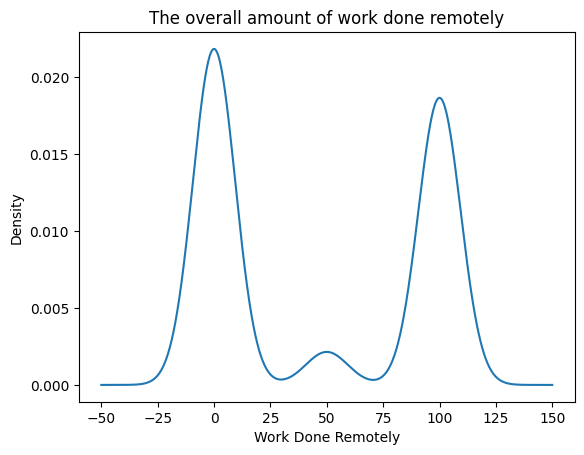

In [131]:
ax=df['remote_ratio'].plot(kind='kde',title="The overall amount of work done remotely")
ax.set_xlabel("Work Done Remotely")

Text(0.5, 0, 'Contracting Branch ')

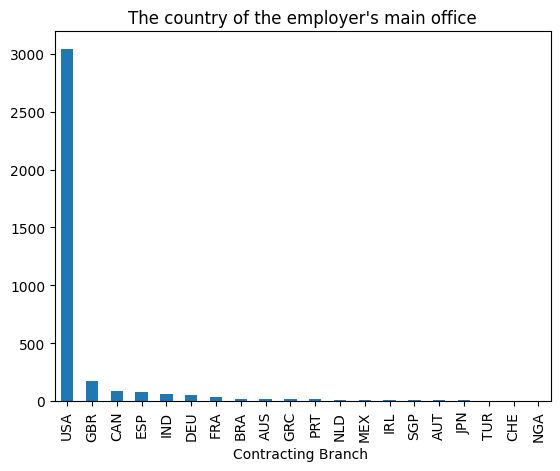

In [132]:
ax=df['company_location'].value_counts().head(20).plot(kind='bar',title="The country of the employer's main office")
ax.set_xlabel("Contracting Branch ")

Text(0.5, 0, 'People Worked For The Company ')

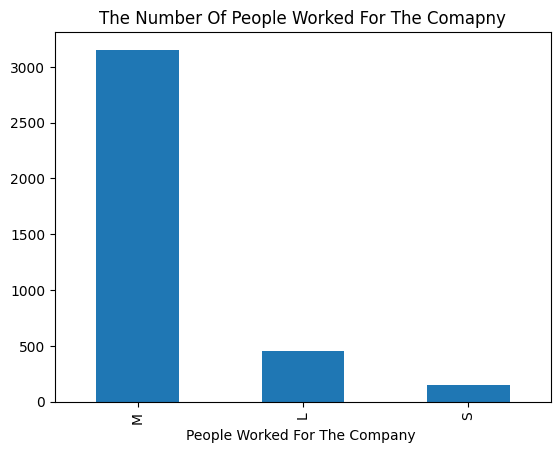

In [133]:
ax=df['company_size'].value_counts().head(20).plot(kind='bar',title="The Number Of People Worked For The Comapny")
ax.set_xlabel("People Worked For The Company ")

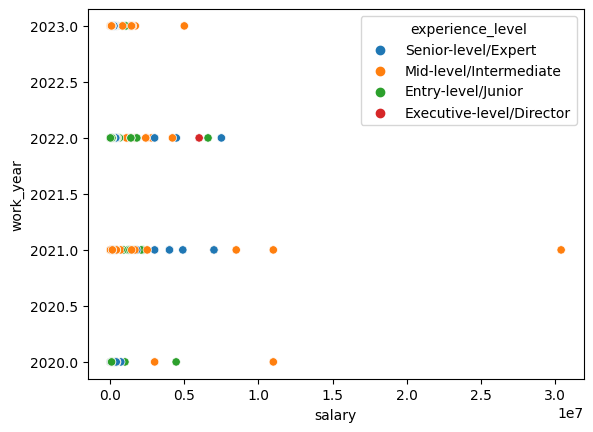

In [134]:
sns.scatterplot(x="salary",y="work_year",hue="experience_level",data=data2)
plt.show()

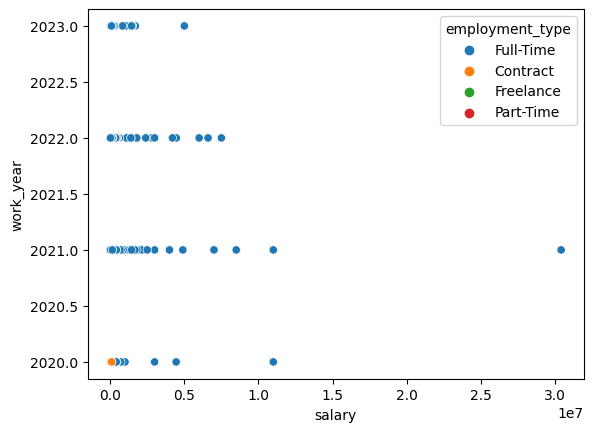

In [135]:
sns.scatterplot(x="salary",y="work_year",hue="employment_type",data=data2)
plt.show()

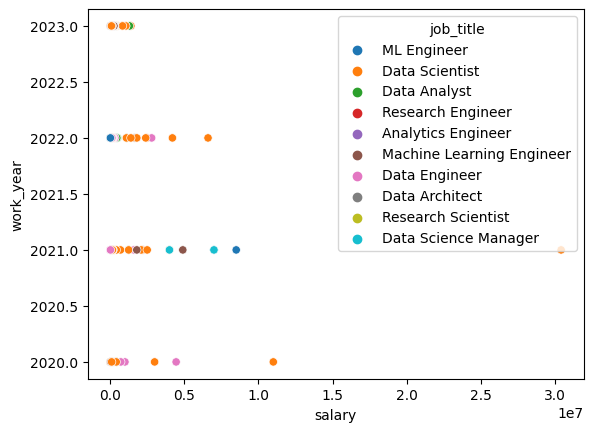

In [136]:
job_counts = data2['job_title'].value_counts()

top10_jobs = job_counts.nlargest(10).index.tolist()

data2_top10 = data2[data2['job_title'].isin(top10_jobs)]

sns.scatterplot(x="salary", y="work_year", hue="job_title", data=data2_top10)
ax.legend(fontsize='small')
plt.show()

In [137]:
df.remote_ratio.unique()

array([100,   0,  50], dtype=int64)

In [138]:
rem_ratio = df.remote_ratio.value_counts()
rem_ratio

remote_ratio
0      1923
100    1643
50      189
Name: count, dtype: int64

<Axes: xlabel='remote_ratio', ylabel='count'>

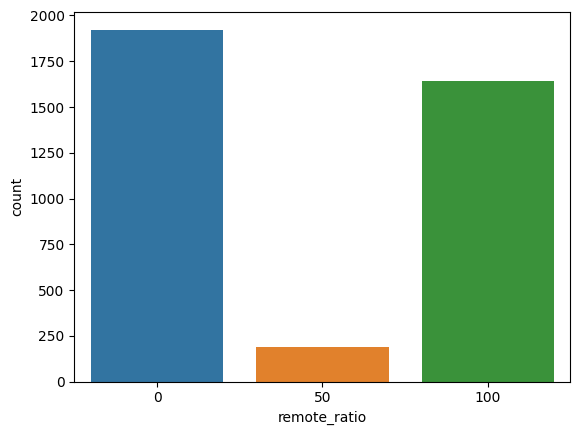

In [139]:
sns.barplot(x=rem_ratio.index, y=rem_ratio)

In [140]:
sal_by_exp = df.salary_in_usd.groupby(df.experience_level).mean()
sal_by_exp.sort_values(inplace=True)
sal_by_exp

experience_level
Entry-level/Junior           78546.284375
Mid-level/Intermediate      104525.939130
Senior-level/Expert         153051.071542
Executive-level/Director    194930.929825
Name: salary_in_usd, dtype: float64

In [141]:
sal_by_title = df.salary_in_usd.groupby(df.job_title).mean()
sal_by_title.sort_values(inplace=True,ascending=False)
sal_by_title

job_title
Data Science Tech Lead           375000.000
Cloud Data Architect             250000.000
Data Lead                        212500.000
Data Analytics Lead              211254.500
Principal Data Scientist         198171.125
                                    ...    
Autonomous Vehicle Technician     26277.500
3D Computer Vision Researcher     21352.250
Staff Data Analyst                15000.000
Product Data Scientist             8000.000
Power BI Developer                 5409.000
Name: salary_in_usd, Length: 93, dtype: float64

[Text(0, 0, 'Data Science Tech Lead'),
 Text(1, 0, 'Cloud Data Architect'),
 Text(2, 0, 'Data Lead'),
 Text(3, 0, 'Data Analytics Lead'),
 Text(4, 0, 'Principal Data Scientist'),
 Text(5, 0, 'Director of Data Science'),
 Text(6, 0, 'Principal Data Engineer'),
 Text(7, 0, 'Machine Learning Software Engineer'),
 Text(8, 0, 'Data Science Manager'),
 Text(9, 0, 'Applied Scientist')]

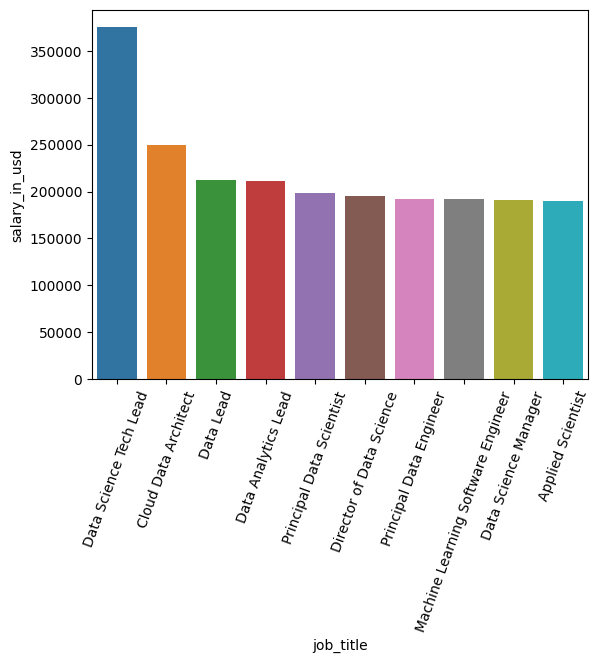

In [142]:
plot = sns.barplot(x=sal_by_title[:10].index,y=sal_by_title[:10])
plot.set_xticklabels(labels=sal_by_title[:10].index,rotation = 70)

In [143]:
sal_by_emp = df.salary_in_usd.groupby(df.employment_type).mean()
sal_by_emp.sort_values(inplace=True)
sal_by_emp

employment_type
Part-Time     39533.705882
Freelance     51807.800000
Contract     113446.900000
Full-Time    138314.199570
Name: salary_in_usd, dtype: float64

<Axes: xlabel='employment_type', ylabel='salary_in_usd'>

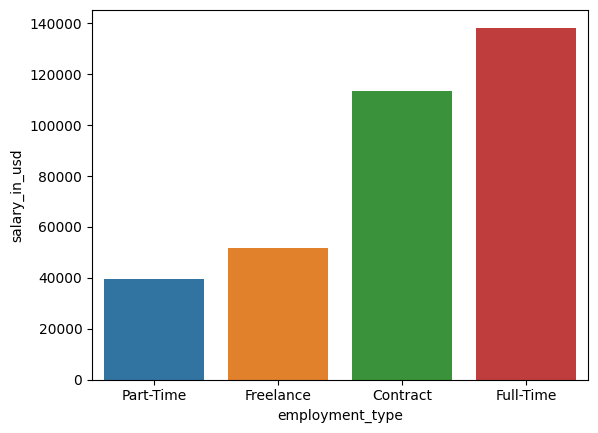

In [144]:
sns.barplot(x=sal_by_emp.index,y=sal_by_emp)

In [145]:
sal_by_rem = df.salary_in_usd.groupby(df.remote_ratio).mean()
sal_by_rem.sort_index(inplace=True)
sal_by_rem

remote_ratio
0      144316.202288
50      78400.687831
100    136481.452830
Name: salary_in_usd, dtype: float64

<Axes: xlabel='remote_ratio', ylabel='salary_in_usd'>

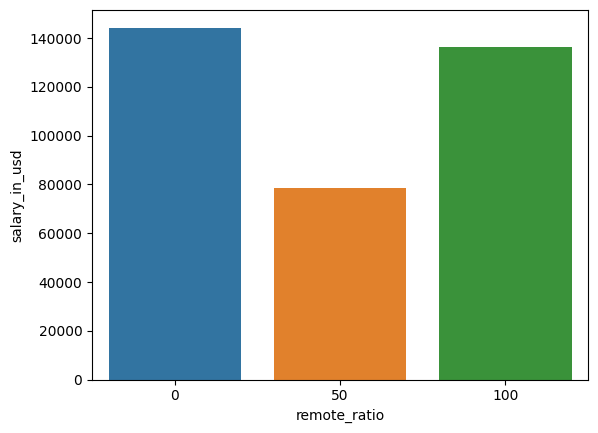

In [146]:
sns.barplot(x=sal_by_rem.index,y=sal_by_rem)

In [147]:
sal_by_loc = df.salary_in_usd.groupby(df.company_location).mean()
sal_by_loc.sort_values(ascending=False,inplace=True)
sal_by_loc

company_location
ISR    271446.500000
PRI    167500.000000
USA    151822.009539
RUS    140333.333333
CAN    131917.689655
           ...      
VNM     12000.000000
MAR     10000.000000
ALB     10000.000000
BOL      7500.000000
MKD      6304.000000
Name: salary_in_usd, Length: 72, dtype: float64

In [148]:
sal_exp_emp = df.groupby(['experience_level','employment_type']).mean()
sal_exp_emp.salary_in_usd

TypeError: Could not convert Applied Machine Learning ScientistBusiness Data Analyst to numeric

In [ ]:
''''output :-
    
    experience_level  employment_type
EN                CT                  65234.500000
                  FL                  75000.000000
                  FT                  80496.529801
                  PT                  38885.000000
EX                CT                 416000.000000
                  FT                 192974.566372
MI                CT                  78600.000000
                  FL                  41615.600000
                  FT                 105321.489899
                  PT                  42561.000000
SE                CT                  97500.000000
                  FL                  53333.333333
                  FT                 153214.454799''''